##**BITS F464 - Semester 1 - MACHINE LEARNING**
--------------------------------------------------------------------------------

**PROJECT - MACHINE LEARNING FOR SUSTAINABLE DEVELOPMENT GOALS (SDGs)**
--------------------------------------------------------------------------------
***Team number:*** 31

---
(*In Title case, separated with commas*)
***Full names of all students in the team:***
Kushal Chakraborty,Ajinkya Medhekar, Ashutosh Wagh, S Shashank, Srinidhi P Katte
---
(*Separated by commas*)
***Id number of all students in the team:***
2022H1030089H, 2022H1030099H, 2022H1030052H, 2022H1030067H, 2022H1030075H

Please refer to the email providing the assignment of project and follow the instructions provided in the project brief.


# **_1. Preprocessing of Dataset_**

### The respective dataset has been shared in the project brief. Please refer to it.

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report,confusion_matrix
import plotly.graph_objects as go
from scipy.stats import norm
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import warnings

In [2]:
warnings.filterwarnings('ignore')

In [3]:
dataset_dataframe = pd.read_csv('Wildfires.csv')
dataset_dataframe.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


In [4]:
dataset_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    int64  
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(8), int64(3), object(2)
memory usage: 52.6+ KB


In [5]:
dataset_dataframe.isna().sum()

X        0
Y        0
month    0
day      0
FFMC     0
DMC      0
DC       0
ISI      0
temp     0
RH       0
wind     0
rain     0
area     0
dtype: int64

In [6]:
dataset_dataframe.describe().T

,count,mean,std,min,25%,50%,75%,max
X,517.0,4.669246,2.313778,1.0,3.0,4.00,7.00,9.00
Y,517.0,4.299807,1.229900,2.0,4.0,4.00,5.00,9.00
FFMC,517.0,90.644681,5.520111,18.7,90.2,91.60,92.90,96.20
DMC,517.0,110.872340,64.046482,1.1,68.6,108.30,142.40,291.30
DC,517.0,547.940039,248.066192,7.9,437.7,664.20,713.90,860.60
ISI,517.0,9.021663,4.559477,0.0,6.5,8.40,10.80,56.10
temp,517.0,18.889168,5.806625,2.2,15.5,19.30,22.80,33.30
RH,517.0,44.288201,16.317469,15.0,33.0,42.00,53.00,100.00
wind,517.0,4.017602,1.791653,0.4,2.7,4.00,4.90,9.40
rain,517.0,0.021663,0.295959,0.0,0.0,0.00,0.00,6.40


In [7]:
dataset_dataframe.dtypes

X          int64
Y          int64
month     object
day       object
FFMC     float64
DMC      float64
DC       float64
ISI      float64
temp     float64
RH         int64
wind     float64
rain     float64
area     float64
dtype: object

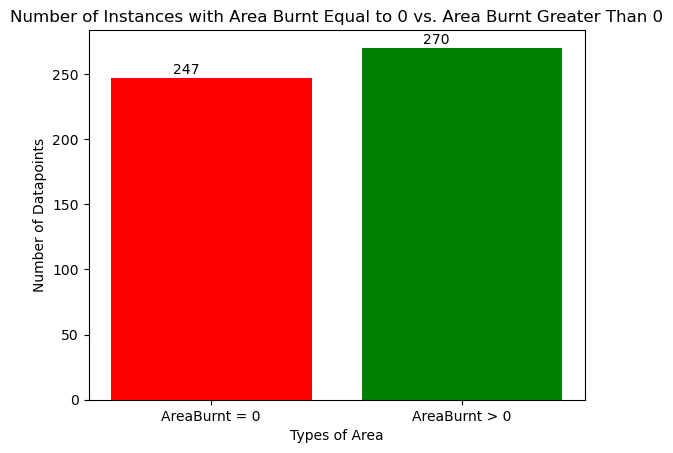

In [9]:
num_datapoints_area_zero = (dataset_dataframe['area'] == 0).sum()
num_datapoints_area_nonzero = (dataset_dataframe['area'] > 0).sum()
labels = ['AreaBurnt = 0', 'AreaBurnt > 0']
values = [num_datapoints_area_zero, num_datapoints_area_nonzero]
colors = ['red', 'green']

fig, ax = plt.subplots()
bars = ax.bar(labels, values, color=colors)

for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.1, bar.get_height() + 1, str(value), ha='center', va='bottom')

plt.title('Number of Instances with Area Burnt Equal to 0 vs. Area Burnt Greater Than 0')
plt.xlabel('Types of Area')
plt.ylabel('Number of Datapoints')

plt.show()

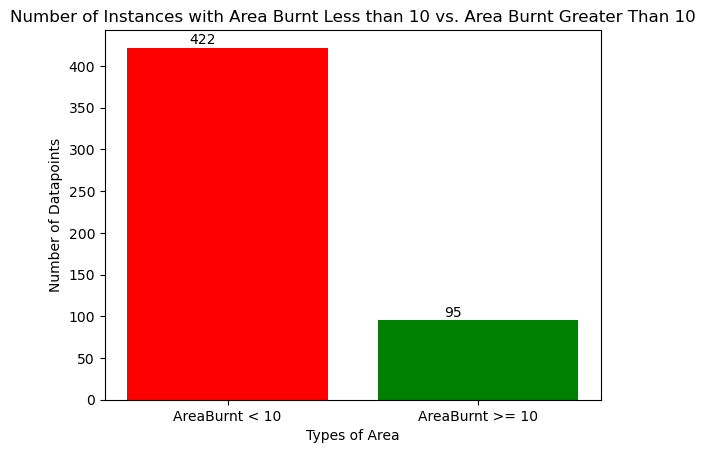

In [10]:
num_datapoints_area_ltten = (dataset_dataframe['area'] < 10).sum()
num_datapoints_area_gtten = (dataset_dataframe['area'] >=10).sum()

labels = ['AreaBurnt < 10', 'AreaBurnt >= 10']
values = [num_datapoints_area_ltten, num_datapoints_area_gtten]
colors = ['red', 'green']

fig, ax = plt.subplots()
bars = ax.bar(labels, values, color=colors)

for bar, value in zip(bars, values):
    plt.text(bar.get_x() + bar.get_width() / 2 - 0.1, bar.get_height() + 1, str(value), ha='center', va='bottom')

plt.title('Number of Instances with Area Burnt Less than 10 vs. Area Burnt Greater Than 10')
plt.xlabel('Types of Area')
plt.ylabel('Number of Datapoints')

plt.show()

In [10]:
num_datapoints_area_nonzero

270

In [11]:
print("Number of datapoints with Area Burnt = 0 is : ")
dataset_dataframe[dataset_dataframe['area'] == 0].shape[0]

Number of datapoints with Area Burnt = 0 is : 


247

In [12]:
print("Number of datapoints with Area Burnt > 0 is : ")
dataset_dataframe[dataset_dataframe['area'] != 0].shape[0]

Number of datapoints with Area Burnt > 0 is : 


270

### Observation

We find that the number of datapoints for AreaBurnt=0 and AreaBurnt>0 are very close to each other.

### Inference

We can use this to create two classes : label of AreaBurnt=0 is 0 and label of AreaBurnt>0 is 1. This will lead to the creation of balanced dataset.

In [13]:
dataset_dataframe[dataset_dataframe['area'] == 0].describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.000000,247.0
mean,4.518219,4.226721,90.219028,106.679757,522.878138,8.851822,18.427935,44.894737,3.913360,0.013765,0.0
std,2.230305,1.289898,6.965969,66.300811,264.637833,4.974102,5.344018,17.581779,1.681857,0.100268,0.0
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,4.200000,15.000000,0.900000,0.000000,0.0
25%,3.000000,4.000000,90.200000,51.300000,360.100000,6.300000,15.200000,32.000000,2.700000,0.000000,0.0
50%,4.000000,4.000000,91.600000,103.200000,661.300000,8.400000,18.600000,42.000000,3.600000,0.000000,0.0
75%,6.000000,5.000000,92.600000,142.400000,706.500000,10.600000,21.600000,54.000000,5.150000,0.000000,0.0
max,9.000000,9.000000,96.200000,290.000000,855.300000,56.100000,32.400000,100.000000,8.500000,1.000000,0.0


In [14]:
dataset_dataframe[dataset_dataframe['area'] != 0].describe()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000,270.000000
mean,4.807407,4.366667,91.034074,114.707778,570.867037,9.177037,19.311111,43.733333,4.112963,0.028889,24.600185
std,2.383326,1.170740,3.709020,61.786520,229.981242,4.147350,6.179444,15.080059,1.884573,0.398392,86.501635
min,1.000000,2.000000,63.500000,3.200000,15.300000,0.800000,2.200000,15.000000,0.400000,0.000000,0.090000
25%,3.000000,4.000000,90.325000,82.900000,486.500000,6.800000,16.125000,33.000000,2.700000,0.000000,2.140000
50%,5.000000,4.000000,91.700000,111.700000,665.600000,8.400000,20.100000,41.000000,4.000000,0.000000,6.370000
75%,7.000000,5.000000,92.975000,141.300000,721.325000,11.375000,23.400000,53.000000,4.900000,0.000000,15.422500
max,9.000000,9.000000,96.200000,291.300000,860.600000,22.700000,33.300000,96.000000,9.400000,6.400000,1090.840000


### Observation

#### FFMC feature

1)The mean of FFMC feature class 0 is 90.21 and of class 1 is 91.03 <br>
2)The standard deviation of FFMC of class 0 is 6.96 and of class 1 is 3.7090. <br>
3)The minimum value of class 0 is 18.7 and of class 1 is 63.5 <br>
4)The max value of class 0 is 96.2 and of class 1 is 96.2<br>
5)The 25 percentile of class 0 is 90.2 and of class 1 is 90.3<br>
6)The 75 percentile of class 0 is 92.6 and of class 1 is 92.9<br>
7)The median of class 0 is 91.6 and of class 1 is 91.7

### DMC

1)The mean of class 0 is 106.67 and of class 1 is 114.70 <br>
2)The standard deviation of class 0 is 264.63 and of class 1 is 114.70. <br>
3)The minimum value of class 0 is 1.10 and of class 1 is 3.2 <br>
4)The max value of class 0 is 290 and of class 1 is 291.3<br>
5)The 25 percentile of class 0 is 51.3 and of class 1 is 82.9<br>
6)The 75 percentile of class 0 is 142.4 and of class 1 is 141.3<br>
7)The median of class 0 is 103.2 and of class 1 is 111.7

### DC

1)The mean of class 0 is 106.67 and of class 1 is 114.70 <br>
2)The standard deviation of class 0 is 264.63 and of class 1 is 114.70. <br>
3)The minimum value of class 0 is 1.10 and of class 1 is 3.2 <br>
4)The max value of class 0 is 290 and of class 1 is 291.3<br>
5)The 25 percentile of class 0 is 51.3 and of class 1 is 82.9<br>
6)The 75 percentile of class 0 is 142.4 and of class 1 is 141.3<br>
7)The median of class 0 is 103.2 and of class 1 is 111.7

### ISI

1)The mean of class 0 is 106.67 and of class 1 is 114.70 <br>
2)The standard deviation of class 0 is 264.63 and of class 1 is 114.70. <br>
3)The minimum value of class 0 is 1.10 and of class 1 is 3.2 <br>
4)The max value of class 0 is 290 and of class 1 is 291.3<br>
5)The 25 percentile of class 0 is 51.3 and of class 1 is 82.9<br>
6)The 75 percentile of class 0 is 142.4 and of class 1 is 141.3<br>
7)The median of class 0 is 103.2 and of class 1 is 111.7

### temp

1)The mean of class 0 is 106.67 and of class 1 is 114.70 <br>
2)The standard deviation of class 0 is 264.63 and of class 1 is 114.70. <br>
3)The minimum value of class 0 is 1.10 and of class 1 is 3.2 <br>
4)The max value of class 0 is 290 and of class 1 is 291.3<br>
5)The 25 percentile of class 0 is 51.3 and of class 1 is 82.9<br>
6)The 75 percentile of class 0 is 142.4 and of class 1 is 141.3<br>
7)The median of class 0 is 103.2 and of class 1 is 111.7

### RH

1)The mean of class 0 is 106.67 and of class 1 is 114.70 <br>
2)The standard deviation of class 0 is 264.63 and of class 1 is 114.70. <br>
3)The minimum value of class 0 is 1.10 and of class 1 is 3.2 <br>
4)The max value of class 0 is 290 and of class 1 is 291.3<br>
5)The 25 percentile of class 0 is 51.3 and of class 1 is 82.9<br>
6)The 75 percentile of class 0 is 142.4 and of class 1 is 141.3<br>
7)The median of class 0 is 103.2 and of class 1 is 111.7

### wind

1)The mean of class 0 is 106.67 and of class 1 is 114.70 <br>
2)The standard deviation of class 0 is 264.63 and of class 1 is 114.70. <br>
3)The minimum value of class 0 is 1.10 and of class 1 is 3.2 <br>
4)The max value of class 0 is 290 and of class 1 is 291.3<br>
5)The 25 percentile of class 0 is 51.3 and of class 1 is 82.9<br>
6)The 75 percentile of class 0 is 142.4 and of class 1 is 141.3<br>
7)The median of class 0 is 103.2 and of class 1 is 111.7

### rain

1)The mean of class 0 is 106.67 and of class 1 is 114.70 <br>
2)The standard deviation of class 0 is 264.63 and of class 1 is 114.70. <br>
3)The minimum value of class 0 is 1.10 and of class 1 is 3.2 <br>
4)The max value of class 0 is 290 and of class 1 is 291.3<br>
5)The 25 percentile of class 0 is 51.3 and of class 1 is 82.9<br>
6)The 75 percentile of class 0 is 142.4 and of class 1 is 141.3<br>
7)The median of class 0 is 103.2 and of class 1 is 111.7



### Analysis of Target variable Area

In this section, we are performing further detailed analysis if target variable "area".

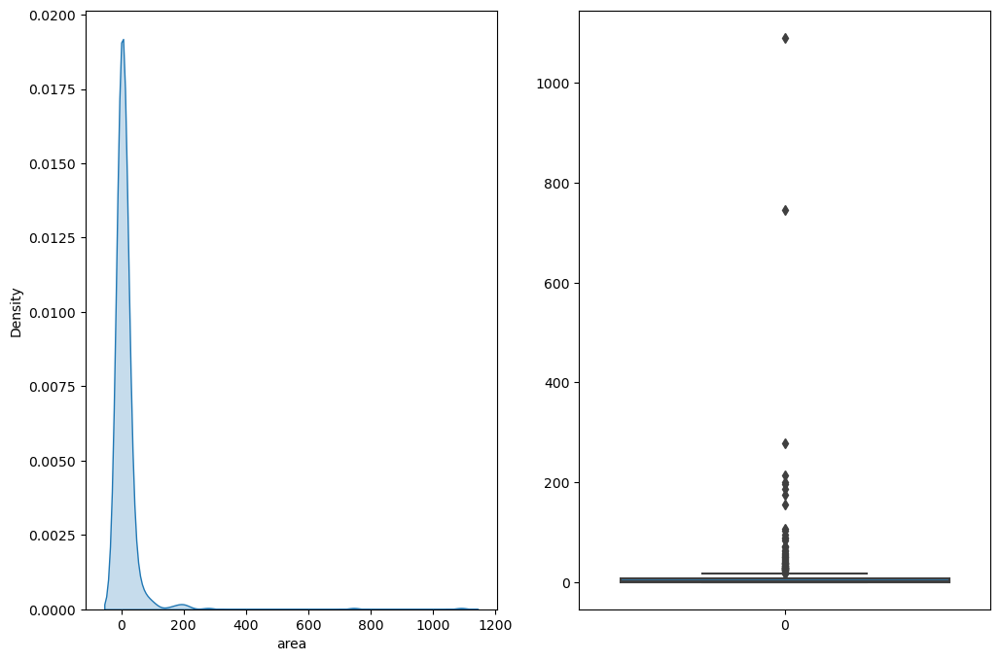

In [15]:
figure, figureaxis =plt.subplots(1,2,figsize=(12,8))
sns.kdeplot(dataset_dataframe['area'],fill=True,ax=figureaxis[0])
sns.boxplot(dataset_dataframe['area'],ax=figureaxis[1])
figure.show()

In [16]:
print('Skewness of feature area burnt before applying logarithmic transform:',dataset_dataframe['area'].skew())

Skewness of feature area burnt before applying logarithmic transform: 12.846933533934868


### Observation

We can see from the above kde plot and box plot that the datapoints are highly skewed towards 0 and have less values towards higher area. Thus the data is left skewed.

In [17]:
area_burnt = dataset_dataframe['area']

percentiles = [25, 50, 75, 90, 95]
percentile_values = np.percentile(area_burnt, percentiles)

# Display percentile values
for i, p in enumerate(percentiles):
    print(f"{p}th percentile: {percentile_values[i]}")

25th percentile: 0.0
50th percentile: 0.52
75th percentile: 6.57
90th percentile: 25.262000000000043
95th percentile: 48.713999999999984


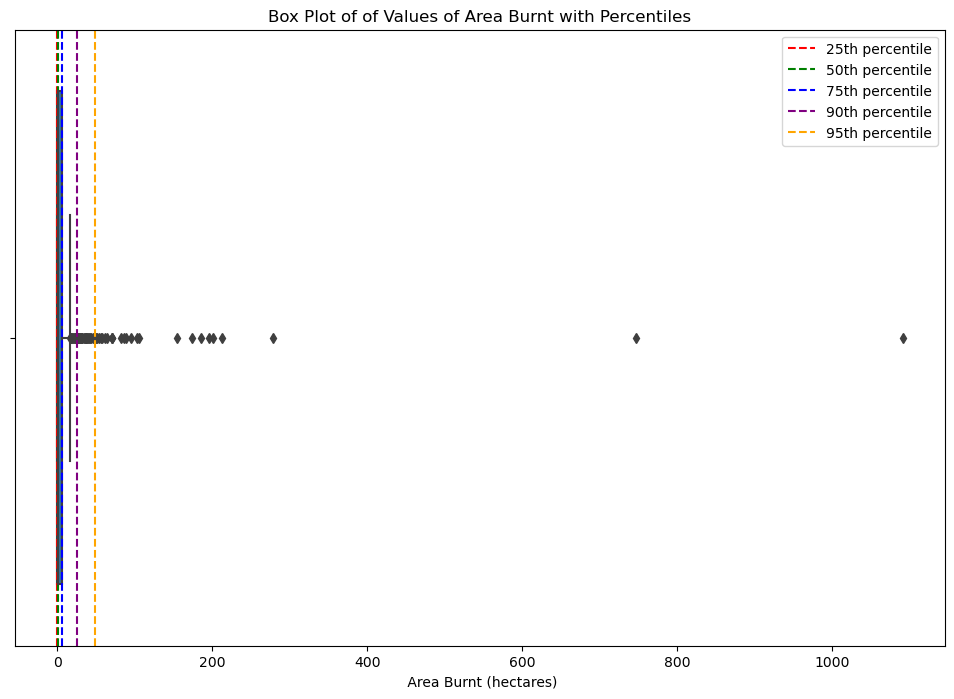

In [18]:
colors = ['red', 'green', 'blue', 'purple', 'orange']

# Create a box plot
plt.figure(figsize=(12, 8))
sns.boxplot(x=area_burnt)
for p, value, color in zip(percentiles, percentile_values, colors):
    plt.axvline(value, color=color, linestyle='--', label=f'{p}th percentile')
plt.xlabel(' Area Burnt (hectares)')
plt.legend()
plt.title('Box Plot of of Values of Area Burnt with Percentiles')
plt.show()


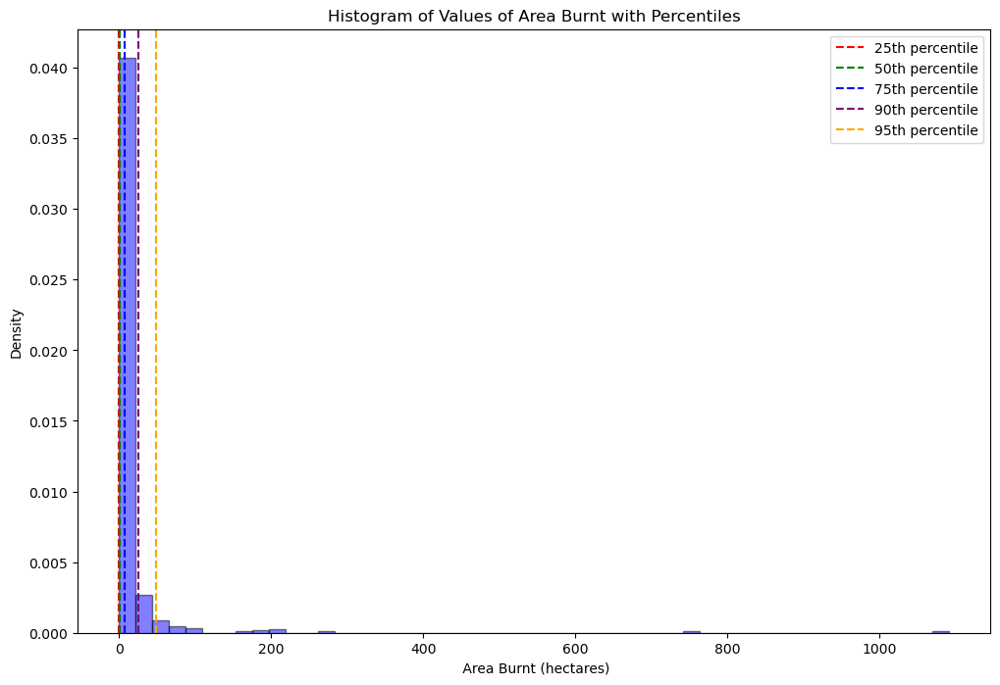

In [19]:
plt.figure(figsize=(12, 8))
plt.hist(area_burnt, bins=50, color='blue', edgecolor='black', alpha=0.5, density=True)
for p, value, color in zip(percentiles, percentile_values, colors):
    plt.axvline(value, color=color, linestyle='--', label=f'{p}th percentile')
plt.xlabel(' Area Burnt (hectares)')
plt.ylabel('Density')
plt.legend()
plt.title('Histogram of Values of Area Burnt with Percentiles')
plt.show()

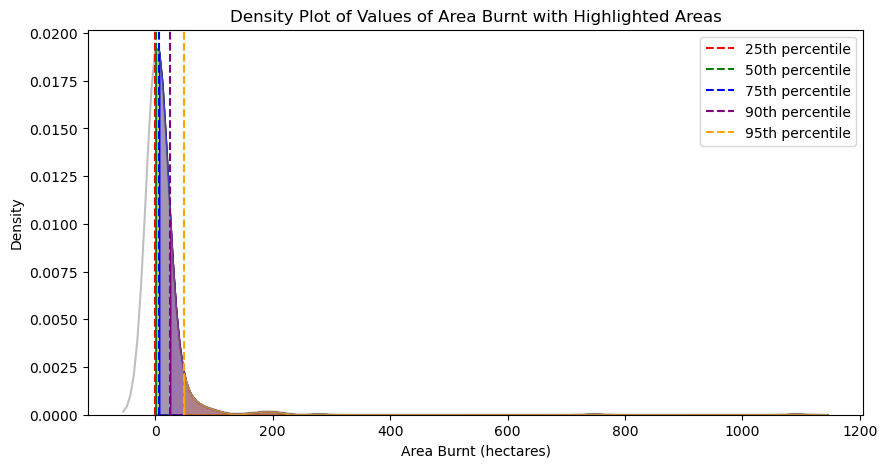

In [20]:
plt.figure(figsize=(10, 5))
sns.kdeplot(area_burnt, fill=False, color='gray', alpha=0.5)

for p, value, color in zip(percentiles, percentile_values, colors):
    plt.axvline(value, color=color, linestyle='--', label=f'{p}th percentile')
    sns.kdeplot(area_burnt, fill=True, clip=(value, np.inf), color=color, alpha=0.2)

plt.xlabel('Area Burnt (hectares)')
plt.ylabel('Density')
plt.legend()
plt.title('Density Plot of Values of Area Burnt with Highlighted Areas')
plt.show()

In [21]:
percentiles = np.arange(0, 101)
percentile_values = np.percentile(area_burnt, percentiles)

# Find the percentile for the value 10 using interpolation
value = 10
percentile_10 = np.interp(value, percentile_values, percentiles)
print(f"The value 10 is at the {percentile_10:.2f}th percentile.")

The value 10 is at the 81.92th percentile.


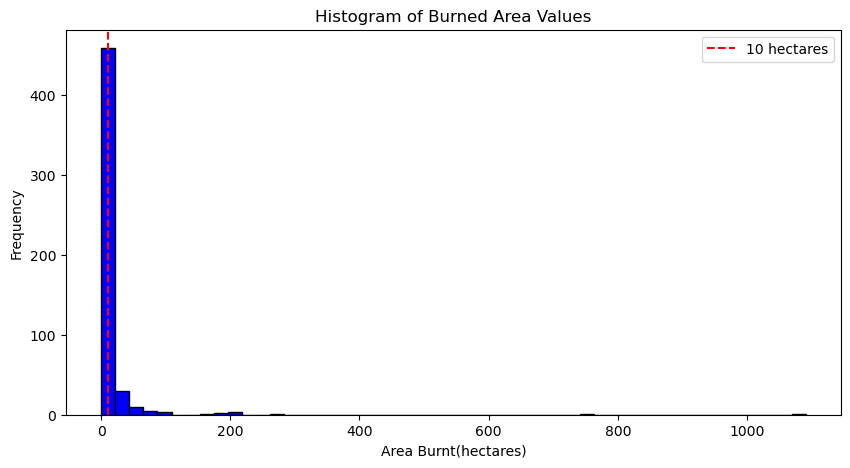

In [22]:
plt.figure(figsize=(10, 5))
plt.hist(area_burnt, bins=50, color='blue', edgecolor='black')
plt.axvline(10, color='red', linestyle='--', label='10 hectares')
plt.xlabel('Area Burnt(hectares)')
plt.ylabel('Frequency')
plt.legend()
plt.title('Histogram of Burned Area Values')
plt.show()

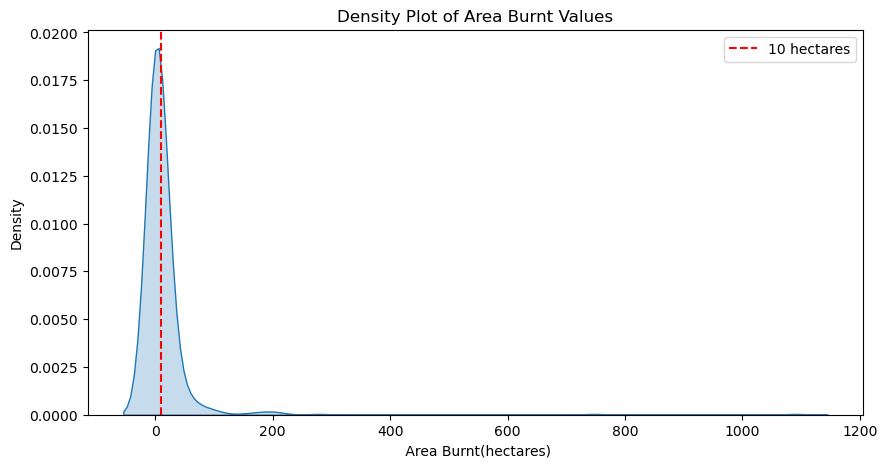

In [23]:
plt.figure(figsize=(10, 5))
sns.kdeplot(area_burnt, fill=True)
plt.axvline(10, color='red', linestyle='--', label='10 hectares')
plt.xlabel(' Area Burnt(hectares)')
plt.ylabel('Density')
plt.legend()
plt.title('Density Plot of Area Burnt Values')
plt.show()

### Observation

In this section we have done a more detailed analysis of the target variable area by finding out and plotting its 25th, 50th, 75th,90th and 95th percentiles.

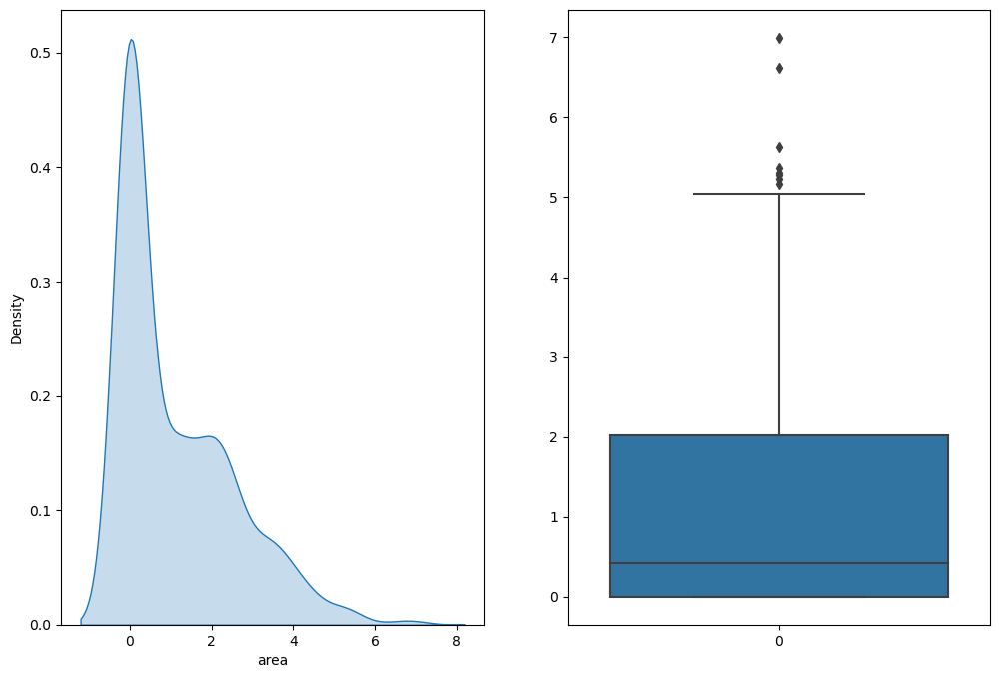

In [24]:
figure1, figure1axis =plt.subplots(1,2,figsize=(12,8))
sns.kdeplot(np.log(1+dataset_dataframe['area']),fill=True,ax=figure1axis[0])
sns.boxplot(np.log(1+dataset_dataframe['area']),ax=figure1axis[1])
figure1.show()

In [25]:
skewness_areaburnt_feat_log_transform = np.log(1 + dataset_dataframe['area'])
print('Skewness of feature area burnt after applying logarithmic transform:',skewness_areaburnt_feat_log_transform.skew())

Skewness of feature area burnt after applying logarithmic transform: 1.2178376559535011


### Observation

We have applied a function transformation and tried to analyse the distribution. The function transformation which we have applied here is ln(1+x). From the above kde plot and box plot we can observe that the skewness towards 0 has slightly decreased and when compared with no transformation we can see that there are more number of values towards the higher area values.

In [26]:
(dataset_dataframe['area'] >= 100).sum()

11

In [27]:
tmp_dataframe = dataset_dataframe.sort_values(['area'])
tmp_dataframe.tail(11)

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
232,6,4,sep,tue,91.0,129.5,692.6,7.0,18.7,43,2.7,0.0,103.39
233,9,4,sep,tue,84.4,73.4,671.9,3.2,24.3,36,3.1,0.0,105.66
234,4,5,sep,sat,92.5,121.1,674.4,8.6,17.7,25,3.1,0.0,154.88
377,2,2,aug,sat,93.7,231.1,715.1,8.4,21.9,42,2.2,0.0,174.63
420,8,8,aug,wed,91.7,191.4,635.9,7.8,26.2,36,4.5,0.0,185.76
235,8,6,aug,sun,91.4,142.4,601.4,10.6,19.6,41,5.8,0.0,196.48
236,2,2,sep,sat,92.5,121.1,674.4,8.6,18.2,46,1.8,0.0,200.94
237,1,2,sep,tue,91.0,129.5,692.6,7.0,18.8,40,2.2,0.0,212.88
479,7,4,jul,mon,89.2,103.9,431.6,6.4,22.6,57,4.9,0.0,278.53
415,8,6,aug,thu,94.8,222.4,698.6,13.9,27.5,27,4.9,0.0,746.28


### Observation and Inference

We have tried to find out the number of values which are >=100. On performing the above analyses we observe that out of 517 datapoints there are only 11 datapoints which are >=100. From this we can infer that the number of datapoints which are >=100 are very small in number. 

In [28]:
print('The Categorical Features of the Dataset are : ')
categorical_feat = dataset_dataframe.select_dtypes(include='object').columns.tolist()
print(categorical_feat)

The Categorical Features of the Dataset are : 
['month', 'day']


In [29]:
print('The Numerical Features of the Dataset are : ')
numerical_feat = dataset_dataframe.select_dtypes(exclude='object').columns.tolist()
print(numerical_feat)

The Numerical Features of the Dataset are : 
['X', 'Y', 'FFMC', 'DMC', 'DC', 'ISI', 'temp', 'RH', 'wind', 'rain', 'area']


### Analysis of Numerical Features

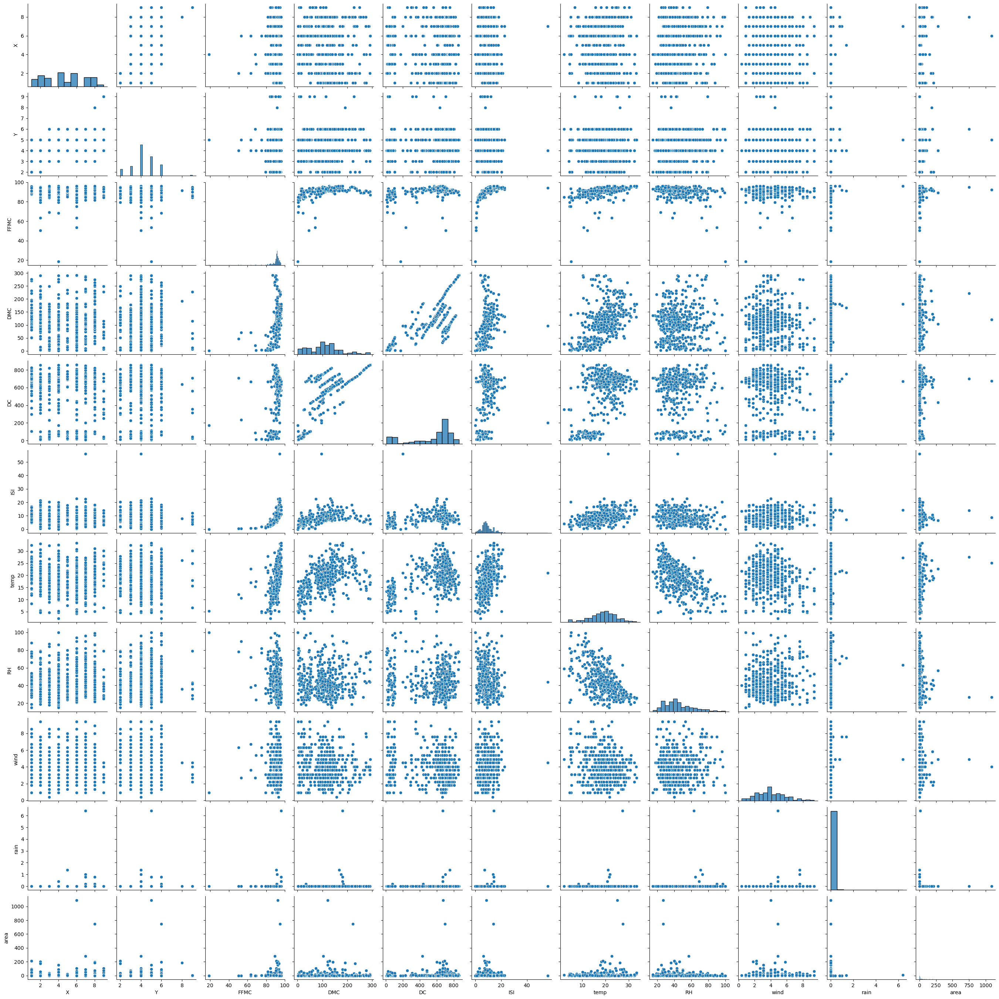

In [30]:
sns.pairplot(dataset_dataframe)

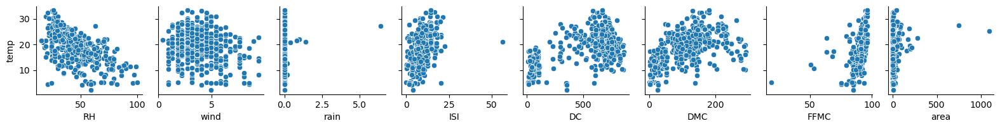

In [31]:
sns.pairplot(dataset_dataframe, x_vars=['RH','wind','rain','ISI','DC','DMC','FFMC','area'], y_vars='temp', height=2, aspect=1,kind='scatter')
plt.show()

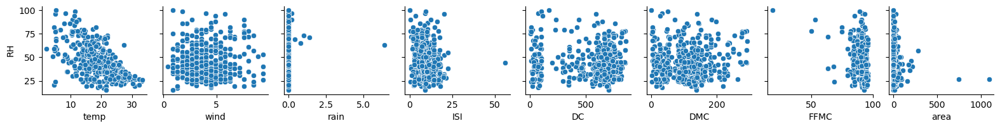

In [32]:
sns.pairplot(dataset_dataframe, x_vars=['temp','wind','rain','ISI','DC','DMC','FFMC','area'], y_vars='RH', height=2, aspect=1,kind='scatter')
plt.show()

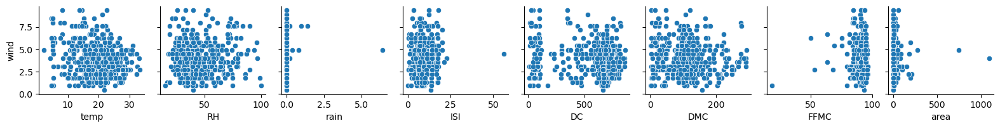

In [33]:
sns.pairplot(dataset_dataframe, x_vars=['temp','RH','rain','ISI','DC','DMC','FFMC','area'], y_vars='wind', height=2, aspect=1,kind='scatter')
plt.show()

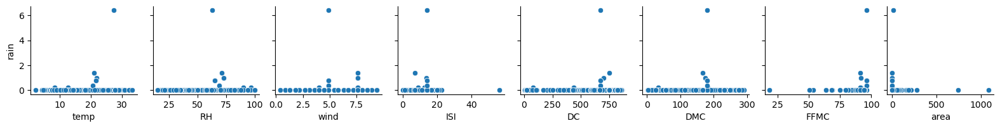

In [34]:
sns.pairplot(dataset_dataframe, x_vars=['temp','RH','wind','ISI','DC','DMC','FFMC','area'], y_vars='rain', height=2, aspect=1,kind='scatter')
plt.show()

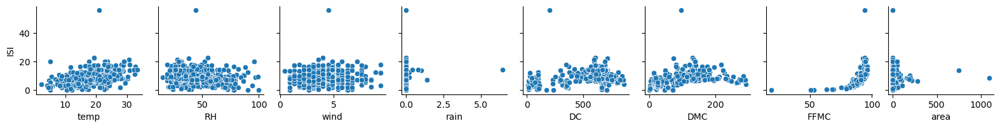

In [35]:
sns.pairplot(dataset_dataframe, x_vars=['temp','RH','wind','rain','DC','DMC','FFMC','area'], y_vars='ISI', height=2, aspect=1,kind='scatter')
plt.show()

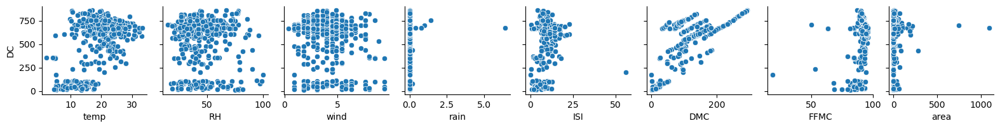

In [36]:
sns.pairplot(dataset_dataframe, x_vars=['temp','RH','wind','rain','ISI','DMC','FFMC','area'], y_vars='DC', height=2, aspect=1,kind='scatter')
plt.show()

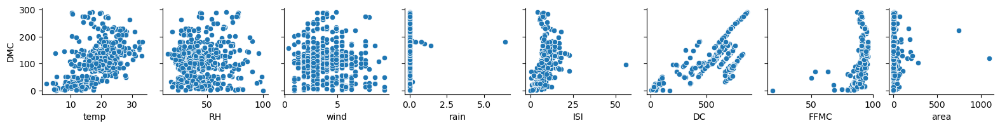

In [37]:
sns.pairplot(dataset_dataframe, x_vars=['temp','RH','wind','rain','ISI','DC','FFMC','area'], y_vars='DMC', height=2, aspect=1,kind='scatter')
plt.show()

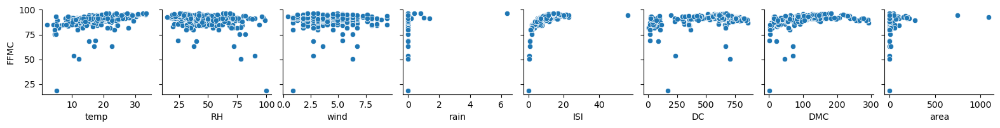

In [38]:
sns.pairplot(dataset_dataframe, x_vars=['temp','RH','wind','rain','ISI','DC','DMC','area'], y_vars='FFMC', height=2, aspect=1,kind='scatter')
plt.show()

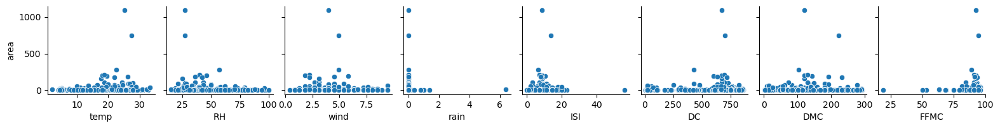

In [39]:
sns.pairplot(dataset_dataframe, x_vars=['temp','RH','wind','rain','ISI','DC','DMC','FFMC'], y_vars='area', height=2, aspect=1,kind='scatter')
plt.show()

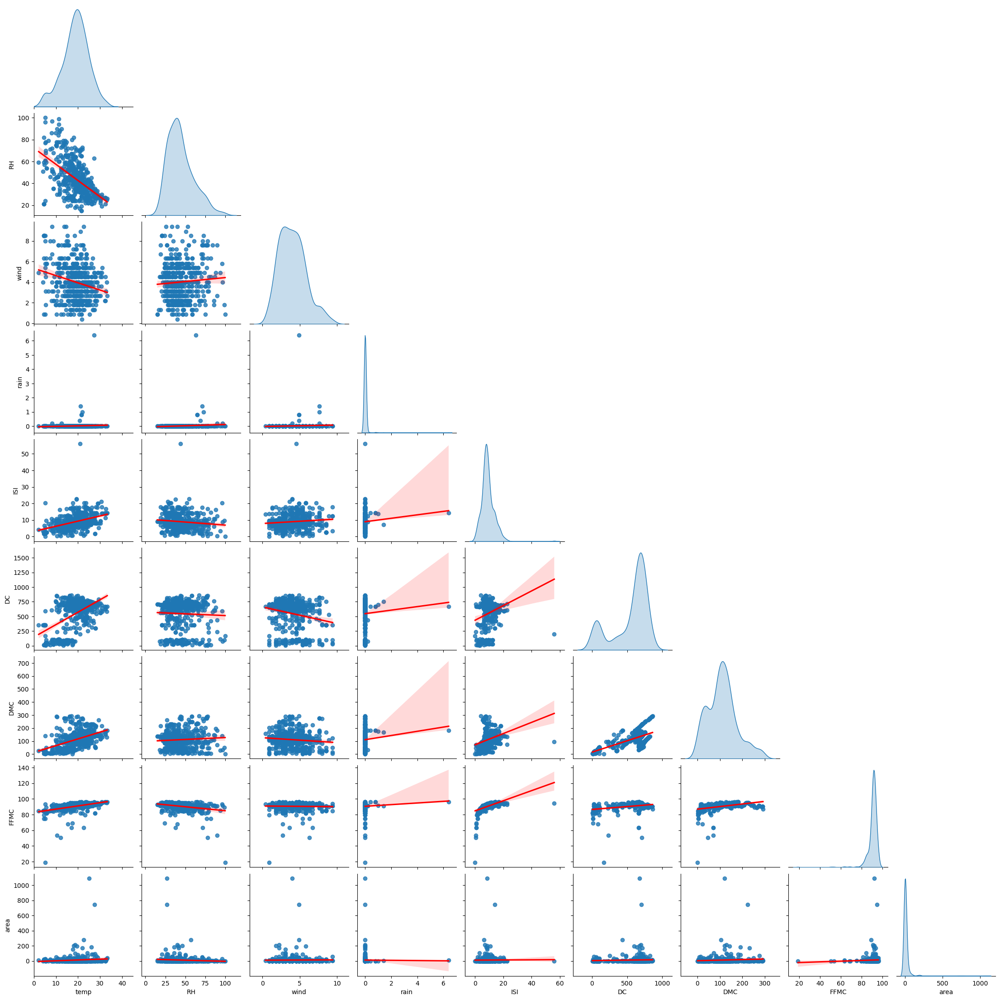

In [40]:
features = ['temp','RH','wind','rain','ISI','DC','DMC','FFMC','area']
pairplotfigures = sns.pairplot(dataset_dataframe[features],diag_kind='kde',kind='reg',corner=True, plot_kws={'line_kws':{'color':'red'}})
for i in range(len(features)):
    pairplotfigures.axes[i,0].set_xlim((0,45))

### Observation

On careful observation we can see that temp vs FFMC, rain vs all the remaining features, DC vs DMC, DC vs FFMC have not exactly but somewhat very close to linear relationships 

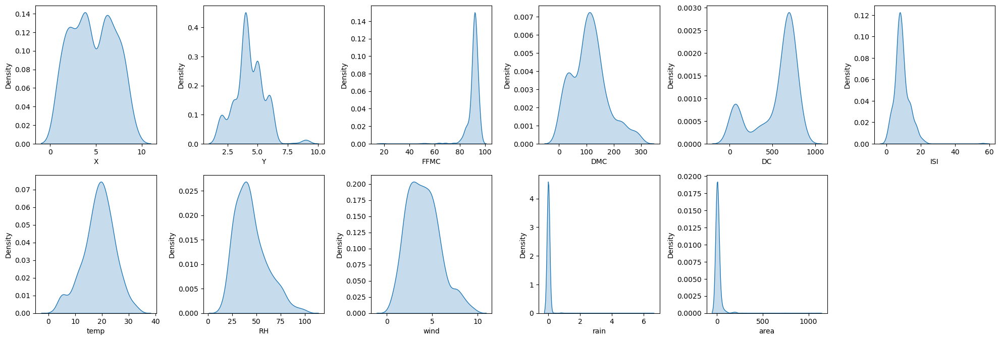

In [41]:
plt.figure(figsize=(20,40))
for i,feat in enumerate(numerical_feat,1):
    plt.subplot(12,6,i)
    sns.kdeplot(dataset_dataframe[feat],fill=True)
plt.tight_layout() 
plt.show()

### Observation

On careful observation of the above plots we can observe that the temperature, RH and wind features have distributions which look very similar to Gaussian distribution.

In [42]:
def boxplots_utility(dataset, feature_list, rows, cols, suptitle):
    figure, figureaxes = plt.subplots(rows, cols, sharey=True, figsize=(13,5))
    figure.suptitle(suptitle,y=1, size=25)
    figureaxes = figureaxes.flatten()
    for i, data in enumerate(feature_list):
        sns.boxplot(data=dataset[data], orient='h', ax=figureaxes[i])
        figureaxes[i].set_title(data + ', skewness is: '+str(round(dataset[data].skew(axis = 0, skipna = True),2)))

In [43]:
numerical_features = list(dataset_dataframe.loc[:,['temp','RH','wind','rain','ISI','DC','DMC','FFMC','area','X','Y' ]])

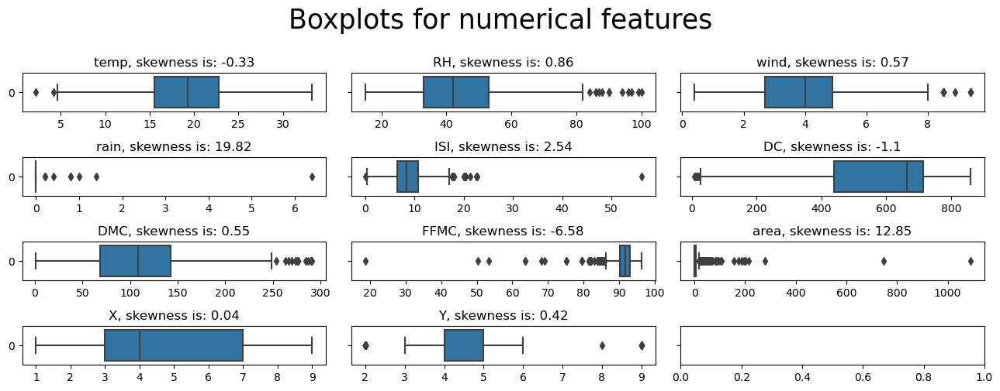

In [44]:
boxplots_utility(dataset=dataset_dataframe, feature_list=numerical_features, rows=4, cols=3, suptitle='Boxplots for numerical features')
plt.tight_layout()

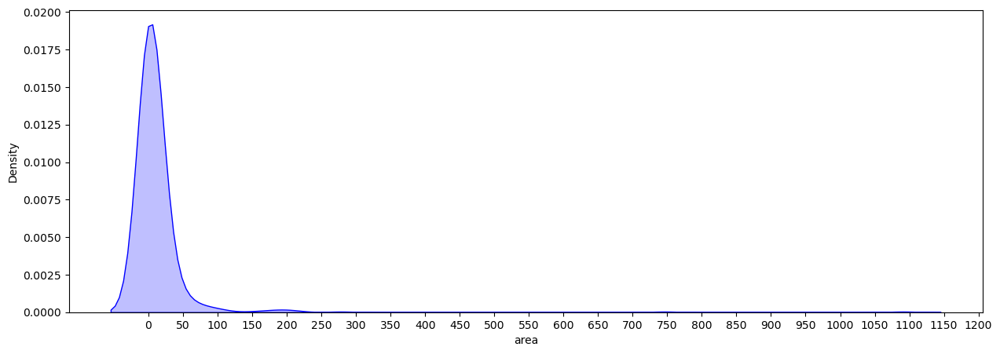

In [45]:
plt.figure(figsize=(15,5))
ax = sns.kdeplot(dataset_dataframe['area'],shade=True,color='b')
plt.xticks([i for i in range(0,1250,50)])
plt.show()

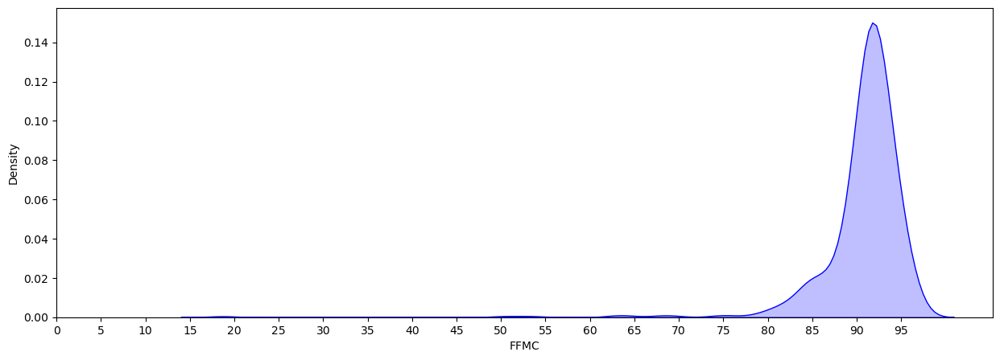

In [46]:
plt.figure(figsize=(15,5))
ax = sns.kdeplot(dataset_dataframe['FFMC'],shade=True,color='b')
plt.xticks([i for i in range(0,100,5)])
plt.show()

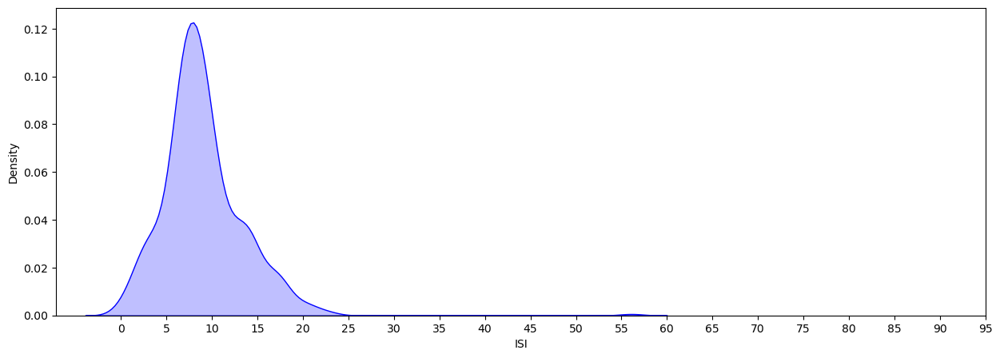

In [47]:
plt.figure(figsize=(15,5))
ax = sns.kdeplot(dataset_dataframe['ISI'],shade=True,color='b')
plt.xticks([i for i in range(0,100,5)])
plt.show()

### Observation

On careful analysis of the plots of the numerical features we can observe that FFMC, ISI ,area and rain are the most heavily skewed features. Area and ISI are left skewed and FFMC are right skewed. Skewnwss of ISI is less than area.

### Analysis of Categorical features

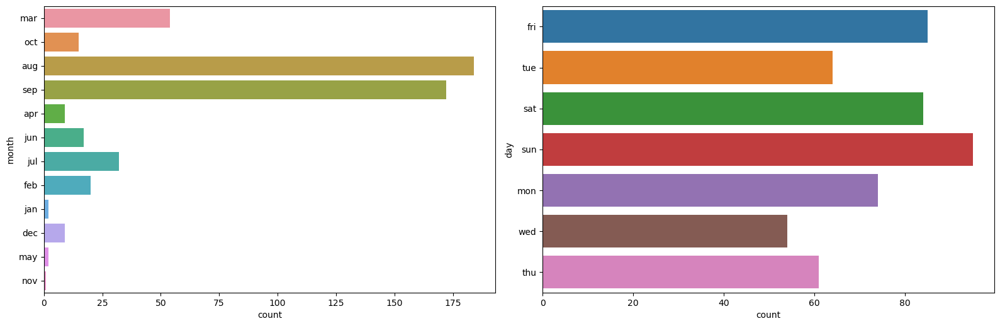

In [48]:
plt.figure(figsize=(16,10))
for i,col in enumerate(categorical_feat,1):
    plt.subplot(2,2,i)
    sns.countplot(data=dataset_dataframe,y=col)
plt.tight_layout()
plt.show()  

### Observation

We can observe that the occurence of wildlife fires mostly occur in the month of September and August.The occurence of forest fires occur mostly on Sunday and the least on Wednesday. On analysing the day graph we can infer that there is not much skewness involved towards any particular day. But in the case of month graph we can observe that the skewness is mostly towards August and September 

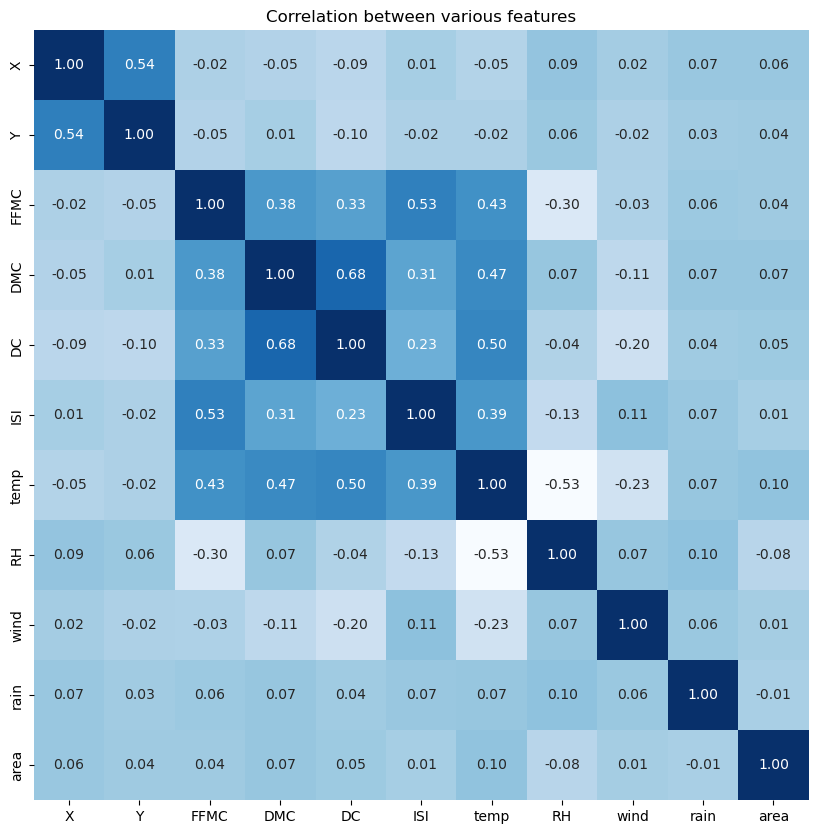

In [49]:
plt.figure(figsize=(10,10))
sns.heatmap(dataset_dataframe.corr(), annot=True, cbar=False, cmap='Blues', fmt='.2f')
plt.title("Correlation between various features")
plt.show()

### Observation

From the above correlation matrix we can observe that DC and DMC are the most related features with a value of 0.68. From this matrix we can observe that the collinearity between any pair of features is not very high. 

<Axes: >

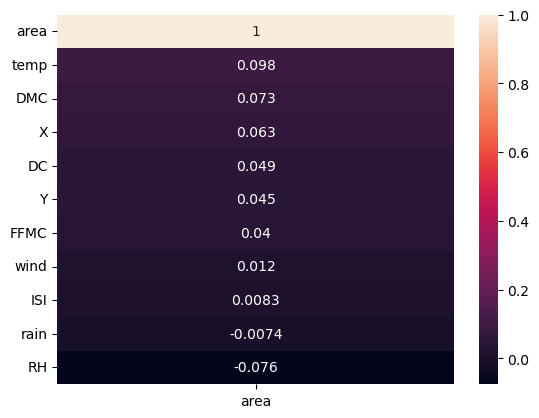

In [50]:
correlation_data = dataset_dataframe.corr()[['area']].sort_values(by='area', ascending=False)
sns.heatmap(correlation_data, annot=True)

### Observation

From the above graph we can observe that temperature is the highest correlated feature and hence the most important feature. Rain and RH are the least correlated features and hence not very important features when considered from the dataset point of view. 

### Analysis of the data from classification point of view

In this section we will divide the datapoints into two classes :<br>
1) Assign Class 0 to the datapoints whose Area Burnt is 0. <br>
2) Assign Class 1 to the datapoints whose Area Burnt is not equal to 0. <br>

We are performing this by using the function area_burnt_bool() and using this function to assign values to a new feature "AreaBurntConf" 

In [51]:
new_dataset_dataframe = dataset_dataframe

In [52]:
def area_burnt_bool(area):
    if area == 0.0:
        return "No area burned"
    else:
        return "Area burned"

In [53]:
new_dataset_dataframe['AreaBurntConf'] = dataset_dataframe['area'].apply(area_burnt_bool)

In [54]:
#new_dataset_dataframe = new_dataset_dataframe.drop(['damage'], axis=1)
new_dataset_dataframe.head(10)

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,AreaBurntConf
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,No area burned
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,No area burned
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,No area burned
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,No area burned
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,No area burned
5,8,6,aug,sun,92.3,85.3,488.0,14.7,22.2,29,5.4,0.0,0.0,No area burned
6,8,6,aug,mon,92.3,88.9,495.6,8.5,24.1,27,3.1,0.0,0.0,No area burned
7,8,6,aug,mon,91.5,145.4,608.2,10.7,8.0,86,2.2,0.0,0.0,No area burned
8,8,6,sep,tue,91.0,129.5,692.6,7.0,13.1,63,5.4,0.0,0.0,No area burned
9,7,5,sep,sat,92.5,88.0,698.6,7.1,22.8,40,4.0,0.0,0.0,No area burned


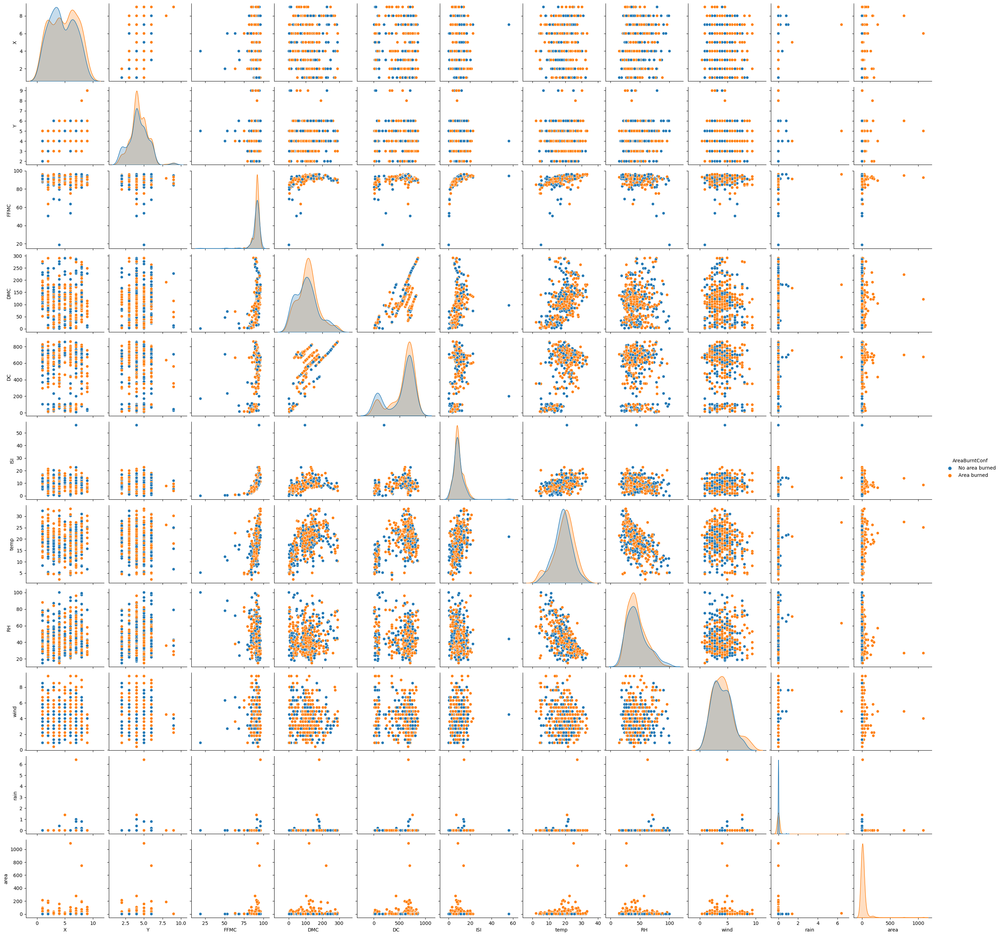

In [55]:
sns.pairplot(new_dataset_dataframe, hue="AreaBurntConf")

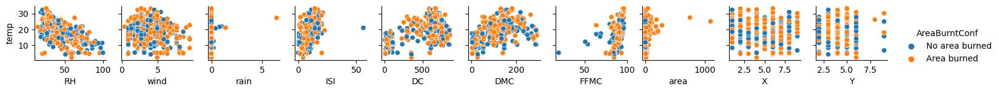

In [56]:
sns.pairplot(new_dataset_dataframe, x_vars=['RH','wind','rain','ISI','DC','DMC','FFMC','area','X','Y' ], y_vars='temp',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

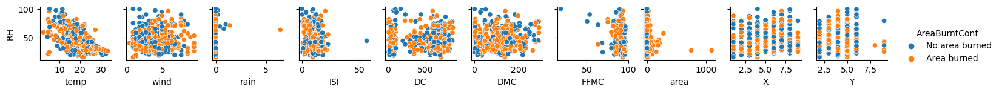

In [57]:
sns.pairplot(new_dataset_dataframe, x_vars=['temp','wind','rain','ISI','DC','DMC','FFMC','area','X','Y' ], y_vars='RH',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

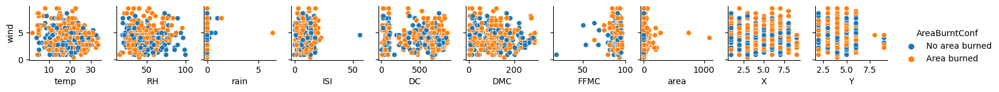

In [58]:
sns.pairplot(new_dataset_dataframe, x_vars=['temp','RH','rain','ISI','DC','DMC','FFMC','area','X','Y' ], y_vars='wind',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

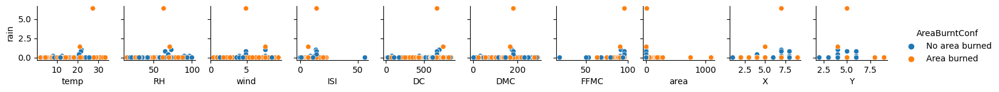

In [59]:
sns.pairplot(new_dataset_dataframe, x_vars=['temp','RH','wind','ISI','DC','DMC','FFMC','area','X','Y' ], y_vars='rain',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

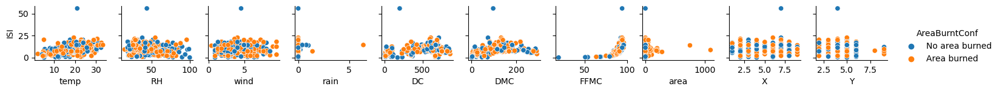

In [60]:
sns.pairplot(new_dataset_dataframe, x_vars=['temp','RH','wind','rain','DC','DMC','FFMC','area','X','Y' ], y_vars='ISI',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

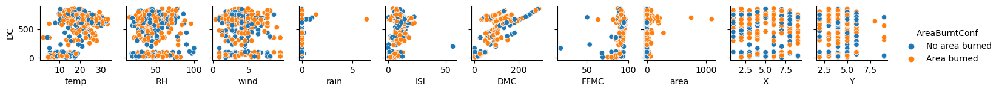

In [61]:
sns.pairplot(new_dataset_dataframe, x_vars=['temp','RH','wind','rain','ISI','DMC','FFMC','area','X','Y' ], y_vars='DC',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

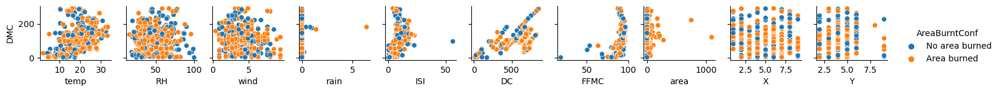

In [62]:
sns.pairplot(new_dataset_dataframe, x_vars=['temp','RH','wind','rain','ISI','DC','FFMC','area','X','Y' ], y_vars='DMC',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

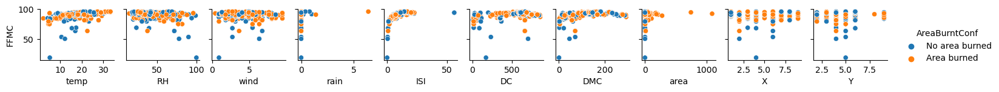

In [63]:
sns.pairplot(new_dataset_dataframe, x_vars=['temp','RH','wind','rain','ISI','DC','DMC','area','X','Y' ], y_vars='FFMC',hue = 'AreaBurntConf', height=1.5, aspect=1,kind='scatter')
plt.show()

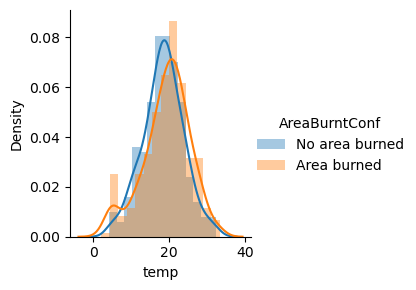

In [64]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"temp")\
   .add_legend();
plt.show()

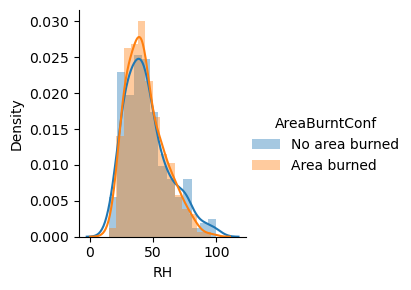

In [65]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"RH")\
   .add_legend();
plt.show()

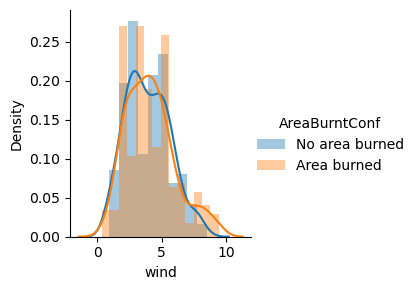

In [66]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"wind")\
   .add_legend();
plt.show()

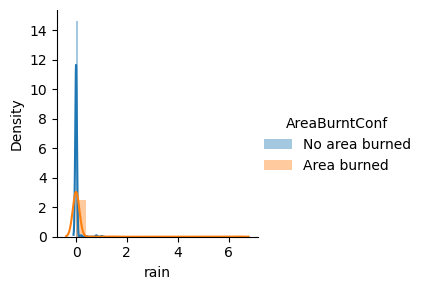

In [67]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"rain")\
   .add_legend();
plt.show()

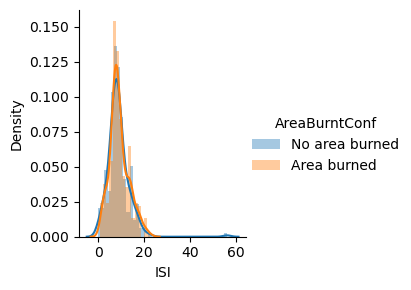

In [68]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"ISI")\
   .add_legend();
plt.show()

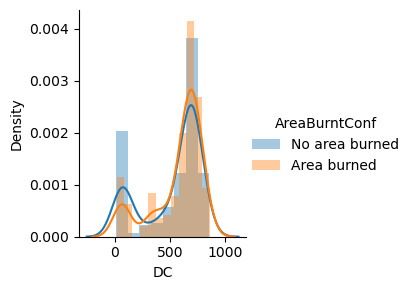

In [69]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"DC")\
   .add_legend();
plt.show()

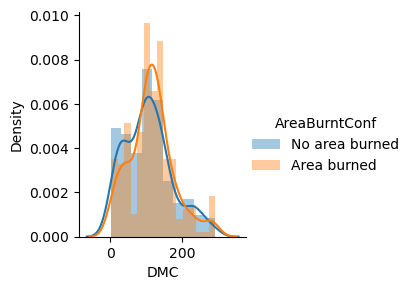

In [70]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"DMC")\
   .add_legend();
plt.show()

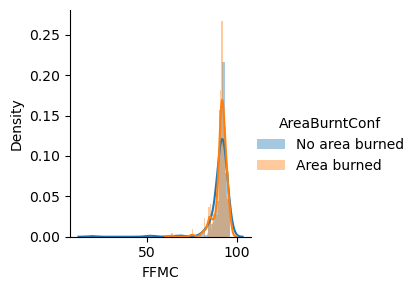

In [71]:
sns.FacetGrid(new_dataset_dataframe,hue="AreaBurntConf")\
   .map(sns.distplot,"FFMC")\
   .add_legend();
plt.show()

### Observation and Inference

From the above plots we can observe that scatter plots and kde plots of both the classes coincide with each other to a very high extent. From this we can infer that we cannot use any of the feature independently to correctly classify the datapoints of both the classes. Hence none of the features are very helpful for the correct classification of the datapoints. 

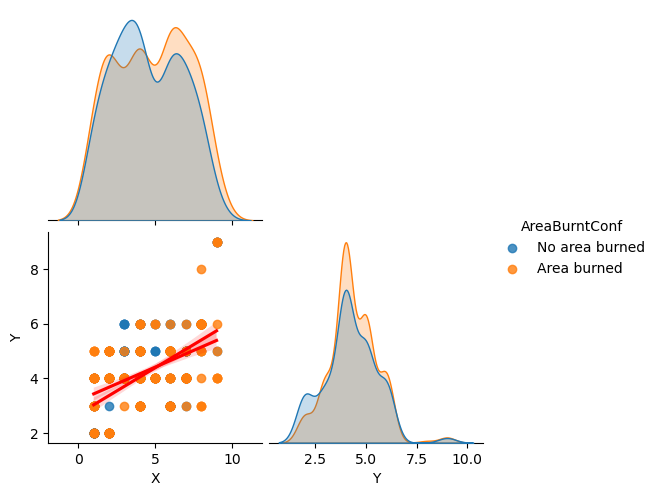

In [72]:
sns.pairplot(new_dataset_dataframe[['X','Y','AreaBurntConf']],hue='AreaBurntConf',kind='reg',corner=True, plot_kws={'line_kws':{'color':'red'}})#,vars=selected_features)
plt.show()

### Observation

From the above graph we can observe that the areas burned are more towards the East than towards the West.

### Data Preparation for Machine Learning Models

In [73]:
new_dataset_dataframe  

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,AreaBurntConf
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,No area burned
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,No area burned
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,No area burned
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,No area burned
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,No area burned
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,Area burned
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,Area burned
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,Area burned
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,No area burned


In [74]:
#dataset_dataframe = dataset_dataframe.drop(['damage'], axis=1)
dataset_dataframe = dataset_dataframe.drop(['AreaBurntConf'], axis=1)

dataset_dataframe


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00


In [75]:
dataset_dataframe_model = dataset_dataframe

In [76]:
dataset_dataframe_model

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00


In [77]:
dataset_dataframe

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00


In [78]:
dataset_dataframe_model['area'].values[dataset_dataframe_model['area'].values > 0] = 1
dataset_dataframe_model = dataset_dataframe_model.rename(columns={'area': 'label'})
dataset_dataframe_model

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,label
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,1.0
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,1.0
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,1.0
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.0


### Observation

In the above code we have discretized the area target variable and provided values to the label target variable in the following way: <br>
1) Datapoints which Area Burned = 0 are assigned the "label" value = 0 <br>
2) Datapoints which Area Burned != 0 are assigned the "label" value = 1

In [79]:
dataset_dataframe_model.corr()

,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,label
X,1.000000,0.539548,-0.021039,-0.048384,-0.085916,0.006210,-0.051258,0.085223,0.018798,0.065387,0.062491
Y,0.539548,1.000000,-0.046308,0.007782,-0.101178,-0.024488,-0.024103,0.062221,-0.020341,0.033234,0.056892
FFMC,-0.021039,-0.046308,1.000000,0.382619,0.330512,0.531805,0.431532,-0.300995,-0.028485,0.056702,0.073823
DMC,-0.048384,0.007782,0.382619,1.000000,0.682192,0.305128,0.469594,0.073795,-0.105342,0.074790,0.062672
DC,-0.085916,-0.101178,0.330512,0.682192,1.000000,0.229154,0.496208,-0.039192,-0.203466,0.035861,0.096724
ISI,0.006210,-0.024488,0.531805,0.305128,0.229154,1.000000,0.394287,-0.132517,0.106826,0.067668,0.035663
temp,-0.051258,-0.024103,0.431532,0.469594,0.496208,0.394287,1.000000,-0.527390,-0.227116,0.069491,0.076047
RH,0.085223,0.062221,-0.300995,0.073795,-0.039192,-0.132517,-0.527390,1.000000,0.069410,0.099751,-0.035587
wind,0.018798,-0.020341,-0.028485,-0.105342,-0.203466,0.106826,-0.227116,0.069410,1.000000,0.061119,0.055702
rain,0.065387,0.033234,0.056702,0.074790,0.035861,0.067668,0.069491,0.099751,0.061119,1.000000,0.025550


In [80]:
dataset_dataframe_model.corr()['label'].sort_values(ascending=False)


label    1.000000
DC       0.096724
temp     0.076047
FFMC     0.073823
DMC      0.062672
X        0.062491
Y        0.056892
wind     0.055702
ISI      0.035663
rain     0.025550
RH      -0.035587
Name: label, dtype: float64

### Observation 
In the above codes we have tried to find the correlation between every pair of features after applying the changes using the "label" target variable.

In [81]:
dataset_dataframe_model.month.replace(('jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'),(1,2,3,4,5,6,7,8,9,10,11,12), inplace=True)
dataset_dataframe_model.day.replace(('mon','tue','wed','thu','fri','sat','sun'),(1,2,3,4,5,6,7), inplace=True)

### Observation

In the above code we have assigned a numerical value to each of the values in the month and day categorical features.<br>
Eg Assigning 1 to Jan, 2 to Feb and so on. Assigning 1 to Mon, 2 to Tue, 3 to Wed and so on.

In [82]:
dataset_dataframe_model

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,label
0,7,5,3,5,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,10,2,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,10,6,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,3,5,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,3,7,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,8,7,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,1.0
513,2,4,8,7,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,1.0
514,7,4,8,7,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,1.0
515,1,4,8,6,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.0


In [83]:
scaler = StandardScaler()
scaler.fit(dataset_dataframe_model.drop('label',axis=1))
stand_features = scaler.transform(dataset_dataframe_model.drop('label',axis=1))
models_data = pd.DataFrame(stand_features,columns=dataset_dataframe_model.columns[:-1])
models_data.head()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain
0,1.008313,0.569860,-1.968443,0.357721,-0.805959,-1.323326,-1.830477,-0.860946,-1.842640,0.411724,1.498614,-0.073268
1,1.008313,-0.244001,1.110120,-1.090909,-0.008102,-1.179541,0.488891,-0.509688,-0.153278,-0.692456,-1.741756,-0.073268
2,1.008313,-0.244001,1.110120,0.840597,-0.008102,-1.049822,0.560715,-0.509688,-0.739383,-0.692456,-1.518282,-0.073268
3,1.440925,1.383722,-1.968443,0.357721,0.191362,-1.212361,-1.898266,-0.004756,-1.825402,3.233519,-0.009834,0.603155
4,1.440925,1.383722,-1.968443,1.323474,-0.243833,-0.931043,-1.798600,0.126966,-1.291012,3.356206,-1.238940,-0.073268


In [84]:
models_data.describe()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain
count,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02,5.170000e+02
mean,2.113074e-16,2.611279e-16,-1.030768e-16,8.589733e-17,-1.752306e-15,-2.748715e-17,6.871787e-17,1.030768e-17,2.542561e-16,2.198972e-16,-4.191790e-16,-6.871787e-18
std,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00,1.000969e+00
min,-1.587360e+00,-1.871724e+00,-2.848033e+00,-1.573785e+00,-1.304582e+01,-1.715608e+00,-2.179108e+00,-1.980578e+00,-2.876943e+00,-1.796637e+00,-2.021098e+00,-7.326831e-02
25%,-7.221360e-01,-2.440010e-01,-2.092640e-01,-1.090909e+00,-8.063453e-02,-6.606652e-01,-4.448281e-01,-5.535954e-01,-5.842379e-01,-6.924563e-01,-7.361236e-01,-7.326831e-02
50%,-2.895238e-01,-2.440010e-01,2.305307e-01,3.577209e-01,1.732292e-01,-4.020255e-02,4.691190e-01,-1.364774e-01,7.082076e-02,-1.403660e-01,-9.833712e-03,-7.326831e-02
75%,1.008313e+00,5.698604e-01,6.703255e-01,8.405974e-01,4.089598e-01,4.927389e-01,6.696628e-01,3.904086e-01,6.741643e-01,5.344111e-01,4.929823e-01,-7.326831e-02
max,1.873537e+00,3.825306e+00,1.989710e+00,1.323474e+00,1.007353e+00,2.819865e+00,1.261610e+00,1.033538e+01,2.484195e+00,3.417549e+00,3.007063e+00,2.157228e+01


### Observation

In the above we have standardized the data of the various features and have found out the various statistical measures of the standardized dataset. The reason for performing standardization of the entire dataset and bringing the values between 0 and 1 is that the sclae of the values of the various features are different and different features can have different indicators for the same value.

In [85]:
X = models_data
y = dataset_dataframe_model['label']
# Split the dataset into train and temp (which includes validation and test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.40, random_state=101)

# Split the temp dataset into cross-validation and test
X_validation, X_test, y_validation, y_test = train_test_split(X_temp, y_temp, test_size=0.50, random_state=101)


In [86]:
X_test

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain
130,-0.289524,1.383722,-2.408238,0.840597,-4.069922,-1.396781,-1.859126,-1.804950,-0.601476,-0.263053,-0.736124,-0.073268
344,0.575701,-1.057862,0.670325,-1.573785,0.155096,0.300505,1.045733,-0.334060,-1.153105,1.331875,0.492982,-0.073268
86,-1.587360,-1.871724,0.670325,-0.125156,0.408960,0.408344,0.639400,0.039151,1.122362,-1.060516,-1.015466,-0.073268
289,1.008313,-0.244001,-0.209264,0.840597,0.173229,-0.104281,-0.294723,-0.004756,0.932740,-0.876486,-1.238940,-0.073268
277,-0.722136,-0.244001,1.989710,-1.573785,-0.951024,-1.335829,-0.799916,-1.409785,-2.463222,-1.428577,2.504247,-0.073268
...,...,...,...,...,...,...,...,...,...,...,...,...
231,-1.587360,0.569860,0.670325,1.323474,0.517759,0.600578,0.728979,-0.202338,1.536084,-1.060516,-0.512650,-0.073268
263,0.575701,-1.057862,0.230531,0.357721,0.082564,0.472422,0.327487,-0.421874,0.070821,-0.324396,-0.233308,-0.073268
283,-0.722136,-0.244001,-2.408238,-0.608032,-0.679028,-1.629650,-2.135529,-1.278064,-1.739210,-0.569770,-0.512650,-0.073268
12,0.575701,0.569860,0.230531,0.357721,-4.922179,-0.626282,0.473558,-1.804950,-0.325662,1.699935,1.498614,-0.073268


### Observation

In the above code we have splitted the dataset into the following 3 sections: <br>
1) 60% of the dataset is the training data assigned for training the models.<br>
2) 20% of the dataset is the cross validation data used for finding the best hyperparameters for the model.<br>
3) 20% of the dataset id the test data used for evaluating the model on the unseen dataset.



# ***2. ML Model 1***

For ML Model 1 we have implemented the KNN model from scratch.

In [87]:
import numpy as np
from collections import Counter

class KNNClassifier:
    def __init__(self, k=3):
        self.k = k

    def fit(self, X, y):
        self.X_train = X
        self.y_train = y

    def euclidean_distance(self, x1, x2):
        #print(x1)
        #print(x2)
        return np.sqrt(np.sum((x1 - x2) ** 2))

    def predict(self, X):
        y_pred = [self._predict(x) for x in X]
        return np.array(y_pred)

    def _predict(self, x):
        # Compute distances between x and all examples in the training set
        distances = [self.euclidean_distance(x, x_train) for x_train in self.X_train]
        # Sort by distance and return indices of the first k neighbors
        k_indices = np.argsort(distances)[:self.k]
        # Extract the labels of the k nearest neighbor training samples
        k_nearest_labels = [self.y_train[i] for i in k_indices]
        # Return the most common class label
        most_common = Counter(k_nearest_labels).most_common(1)
        return most_common[0][0]


In [88]:
def calculate_accuracy(y_true, y_pred):
    correct = np.sum(y_true == y_pred)
    total = len(y_true)
    accuracy = correct / total
    return accuracy

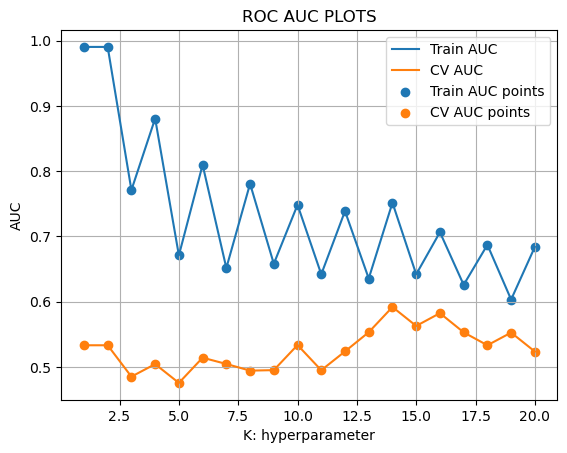

In [89]:
train_auc = []
cv_auc = []
K = list(range(1,21))
for i in K:
    neigh = KNNClassifier(k=i)
    neigh.fit(X_train.to_numpy(), y_train.tolist())

    y_train_pred = neigh.predict(X_train.to_numpy())    
    y_cv_pred = neigh.predict(X_validation.to_numpy())

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train.tolist(),y_train_pred))
    cv_auc.append(roc_auc_score(y_validation.tolist(), y_cv_pred))

plt.plot(K, train_auc, label='Train AUC')
plt.plot(K, cv_auc, label='CV AUC')

plt.scatter(K, train_auc, label='Train AUC points')
plt.scatter(K, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("K: hyperparameter")
plt.ylabel("AUC")
plt.title("ROC AUC PLOTS")
plt.grid()
plt.show()

In [90]:
best_k = K[cv_auc.index(max(cv_auc))]
best_k

14

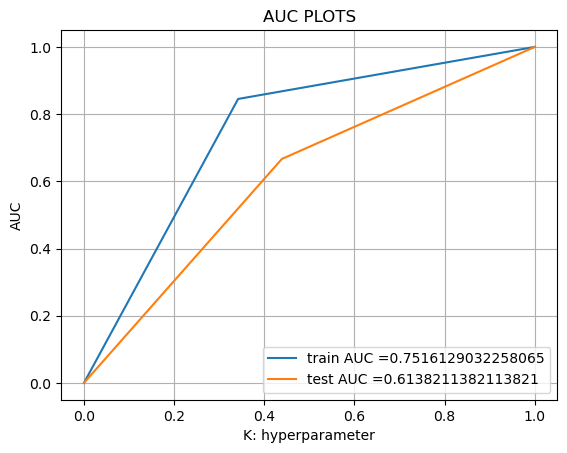

In [91]:
neigh = KNNClassifier(k=best_k)
neigh.fit(X_train.to_numpy(), y_train.tolist())
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = neigh.predict(X_train.to_numpy())    
y_test_pred = neigh.predict(X_test.to_numpy()) 

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("K: hyperparameter")
plt.ylabel("AUC")
plt.title("AUC PLOTS")
plt.grid()
plt.show()

In [92]:
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [93]:
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.2250156087408949 for threshold 1.0
[[102  53]
 [ 24 131]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.24628197501487212 for threshold 1.0
[[23 18]
 [21 42]]


the maximum value of tpr*(1-fpr) 0.2250156087408949 for threshold 1.0


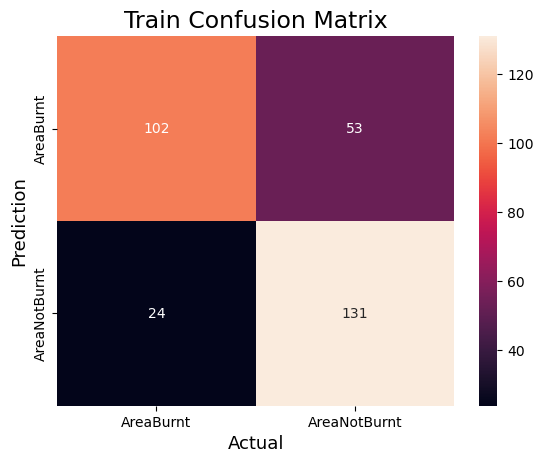

In [94]:
cm = confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Train Confusion Matrix',fontsize=17)
plt.show()

the maximum value of tpr*(1-fpr) 0.24628197501487212 for threshold 1.0


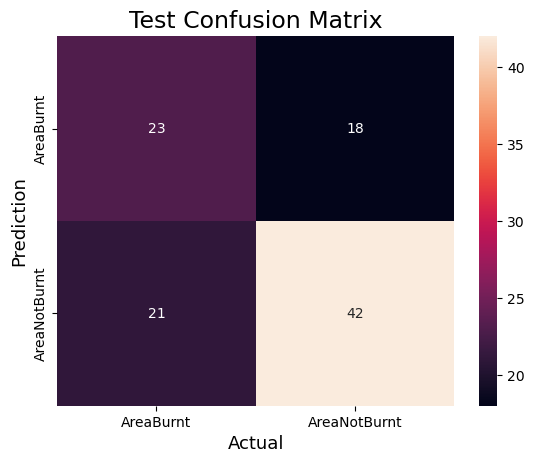

In [95]:
cm = confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Test Confusion Matrix',fontsize=17)
plt.show()

In [96]:
tp = cm[0][0]
fp = cm[0][1]
fn = cm[1][0]
tn = cm[1][1]
precision = tp / (tp + fp)
recall = tp / (tp + fn)
f1score = (2 * precision * recall) / (precision + recall)
print('Precision is :')
print(precision)
print('Recall is :')
print(recall)
print('F1-Score is :')
print(f1score)

Precision is :
0.5609756097560976
Recall is :
0.5227272727272727
F1-Score is :
0.5411764705882354


# ***3. ML Model 2***



For ML Model 2 we have implemented the Multinomial Naive Bayes Model uisng Laplace Smoothing

In [97]:
class MultinomialNaiveBayes:
    def __init__(self, alpha=1.0):
        self.alpha = alpha  # Laplace smoothing parameter
        self.class_counts = {}  # Counts of each class
        self.feature_counts = {}  # Counts of each feature for each class
        self.class_prior = {}  # Prior probabilities of each class

    def fit(self, X, y):
        # Count the occurrences of each class
        for class_label in y:
            if class_label not in self.class_counts:
                self.class_counts[class_label] = 0
            self.class_counts[class_label] += 1

        # Count the occurrences of each feature for each class
        for i in range(len(X)):
            class_label = y[i]
            if class_label not in self.feature_counts:
                self.feature_counts[class_label] = {}
            for feature in X[i]:
                if feature not in self.feature_counts[class_label]:
                    self.feature_counts[class_label][feature] = 0
                self.feature_counts[class_label][feature] += 1

        # Calculate class priors
        total_samples = len(y)
        for class_label, count in self.class_counts.items():
            self.class_prior[class_label] = count / total_samples

    def _calculate_class_probabilities(self, X):
        class_probs = {}
        for class_label, class_count in self.class_counts.items():
            log_prob = np.log(self.class_prior[class_label])
            for feature in X:
                if feature in self.feature_counts[class_label]:
                    count = self.feature_counts[class_label][feature] + self.alpha
                else:
                    count = self.alpha
                log_prob += np.log(count / (class_count + self.alpha * len(self.feature_counts[class_label])))
            class_probs[class_label] = log_prob
        return class_probs

    def predict(self, X):
        predictions = []
        for x in X:
            class_probs = self._calculate_class_probabilities(x)
            predicted_class = max(class_probs, key=class_probs.get)
            predictions.append(predicted_class)
        return predictions


In [98]:
import math
alpha_range = [1,0.5,0.1,0.05,0.01,0.005,0.001,0.0005,0.00001]
la =[]
for i in range(len(alpha_range)) :
    la.append(math.log(alpha_range[i]))

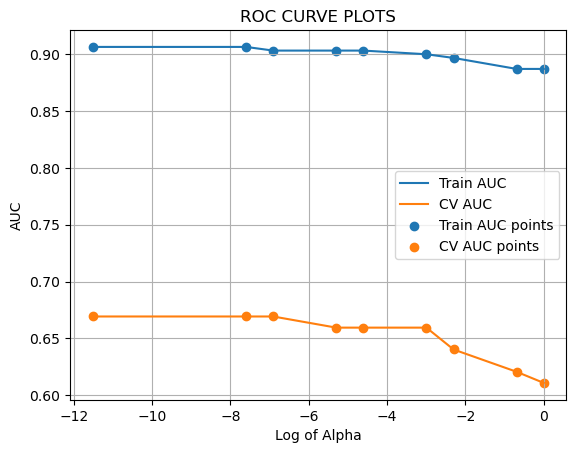

In [99]:
train_auc = []
cv_auc = []
alpha_range = [1,0.5,0.1,0.05,0.01,0.005,0.001,0.0005,0.00001]
for i in alpha_range:
    mnb = MultinomialNaiveBayes(alpha = i)
    mnb.fit(X_train.to_numpy(), y_train.tolist())

    y_train_pred = mnb.predict(X_train.to_numpy())     
    y_cv_pred = mnb.predict(X_validation.to_numpy())

    # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
    # not the predicted outputs        
    train_auc.append(roc_auc_score(y_train,y_train_pred))
    cv_auc.append(roc_auc_score(y_validation, y_cv_pred))

plt.plot(la, train_auc, label='Train AUC')
plt.plot(la, cv_auc, label='CV AUC')

plt.scatter(la, train_auc, label='Train AUC points')
plt.scatter(la, cv_auc, label='CV AUC points')

plt.legend()
plt.xlabel("Log of Alpha")
plt.ylabel("AUC")
plt.title("ROC CURVE PLOTS")
plt.grid()
plt.show()

In [100]:
best_alpha = alpha_range[cv_auc.index(max(cv_auc))]

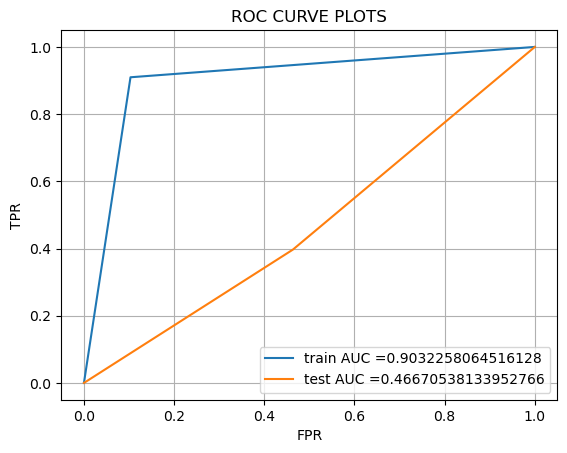

In [101]:
mnb = MultinomialNaiveBayes(alpha = best_alpha)
mnb.fit(X_train.to_numpy(), y_train.tolist())
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = mnb.predict(X_train.to_numpy())
y_test_pred = mnb.predict(X_test.to_numpy())

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC CURVE PLOTS")
plt.grid()
plt.show()

In [102]:
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [103]:
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr)))

Train confusion matrix
the maximum value of tpr*(1-fpr) 0.09257023933402705 for threshold 1.0
[[139  16]
 [ 14 141]]
Test confusion matrix
the maximum value of tpr*(1-fpr) 0.248661511005354 for threshold 1.0
[[22 19]
 [38 25]]


the maximum value of tpr*(1-fpr) 0.09257023933402705 for threshold 1.0


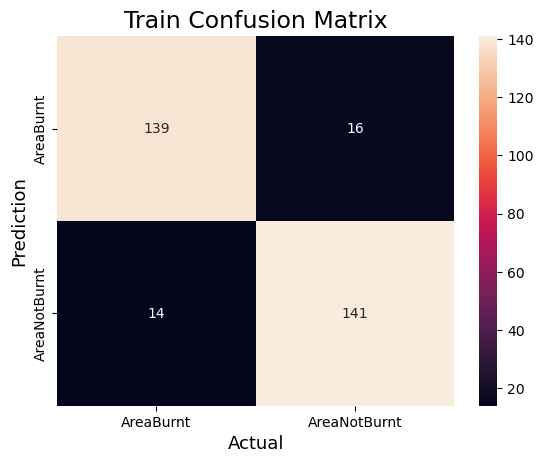

In [104]:
cm = confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Train Confusion Matrix',fontsize=17)
plt.show()

the maximum value of tpr*(1-fpr) 0.248661511005354 for threshold 1.0


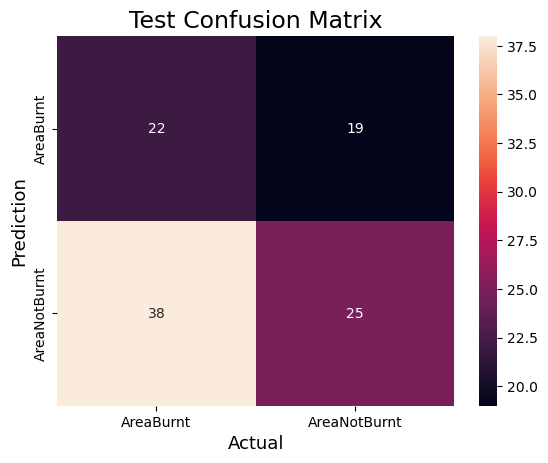

In [105]:
cm = confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Test Confusion Matrix',fontsize=17)
plt.show()

In [106]:
tp = cm[0][0]
fp = cm[0][1]
fn = cm[1][0]
tn = cm[1][1]
precision = tp / (tp + fp)
recall = tp / (tp + fn)
f1score = (2 * precision * recall) / (precision + recall)
print('Precision is :')
print(precision)
print('Recall is :')
print(recall)
print('F1-Score is :')
print(f1score)

Precision is :
0.5365853658536586
Recall is :
0.36666666666666664
F1-Score is :
0.4356435643564356


# ***4. ML Model 3***

For ML Model 3 we have implemented the Multilayer Perceptron from scratch

In [107]:
import numpy as np

class NeuralNetwork:
    def __init__(self, input_size, hidden_size, output_size, learning_rate=0.01):
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.output_size = output_size
        self.learning_rate = learning_rate

        # Initialize weights and biases with random values
        self.weights_input_hidden = np.random.rand(self.input_size, self.hidden_size)
        self.bias_hidden = np.zeros((1, self.hidden_size))
        self.weights_hidden_output = np.random.rand(self.hidden_size, self.output_size)
        self.bias_output = np.zeros((1, self.output_size))

    def sigmoid(self, x):
        return 1 / (1 + np.exp(-x))

    def sigmoid_derivative(self, x):
        return x * (1 - x)

    def forward(self, X):
        # Forward propagation through the network
        self.hidden_input = np.dot(X, self.weights_input_hidden) + self.bias_hidden
        self.hidden_output = self.sigmoid(self.hidden_input)
        self.output_input = np.dot(self.hidden_output, self.weights_hidden_output) + self.bias_output
        self.output = (self.sigmoid(self.output_input) >= 0.5).astype(int)

    def backward(self, X, y):
        # Backpropagation
        self.output_error = y - self.output
        self.output_delta = self.output_error * self.sigmoid_derivative(self.output)
        self.hidden_error = self.output_delta.dot(self.weights_hidden_output.T)
        self.hidden_delta = self.hidden_error * self.sigmoid_derivative(self.hidden_output)

        # Update weights and biases
        self.weights_hidden_output += self.hidden_output.T.dot(self.output_delta) * self.learning_rate
        self.weights_input_hidden += X.T.dot(self.hidden_delta) * self.learning_rate
        self.bias_output += np.sum(self.output_delta, axis=0) * self.learning_rate
        self.bias_hidden += np.sum(self.hidden_delta, axis=0) * self.learning_rate

    def train(self, X, y, epochs):
        for _ in range(epochs):
            self.forward(X)
            self.backward(X, y)

    def predict(self, X):
        self.forward(X)
        predictions = (self.output >= 0.5).astype(int)
        return predictions
    
    def calculate_accuracy(self, y_true, y_pred):
        correct = np.sum(y_true == y_pred)
        total = len(y_true)
        accuracy = correct / total
        error = 1 - accuracy
        return error
    def calculate_roc_auc(self, y_true, y_pred):
        return roc_auc_score(y_true, y_pred)

In [108]:
y_train_list = [[x] for x in y_train.tolist()]
y_test_list = [[x] for x in y_test.tolist()]

In [109]:
train_roc_auc_values = []
test_roc_auc_values = []
nn = NeuralNetwork(input_size=12, hidden_size=8, output_size=1)  # Adjust hidden_size as needed
epochs = 10000
train_errors = []
test_errors = []

for epoch in range(epochs):
    nn.train(X_train.to_numpy(), y_train_list, 1)

    train_pred = nn.predict(X_train.to_numpy())
    train_error = nn.calculate_accuracy(y_train_list, train_pred)
    train_errors.append(train_error)
    train_roc_auc = nn.calculate_roc_auc(y_train, train_pred)
    train_roc_auc_values.append(train_roc_auc)
 
    test_pred = nn.predict(X_test.to_numpy())
    test_error = nn.calculate_accuracy(y_test_list, test_pred)
    test_errors.append(test_error)
    test_roc_auc = nn.calculate_roc_auc(y_test, test_pred)
    test_roc_auc_values.append(test_roc_auc)

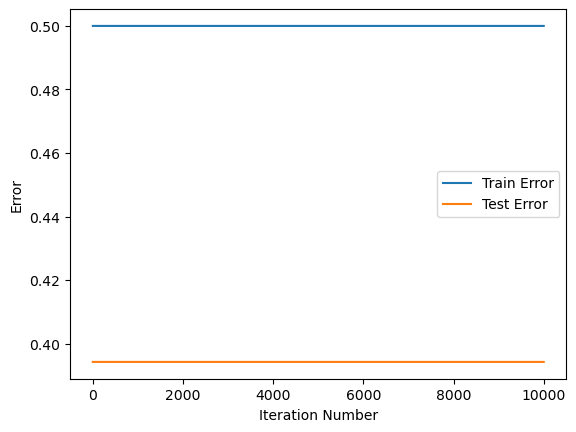

In [110]:
plt.plot(range(1, epochs + 1), train_errors, label="Train Error")
plt.plot(range(1, epochs + 1), test_errors, label="Test Error")
plt.xlabel("Iteration Number")
plt.ylabel("Error")
plt.legend()
plt.show()


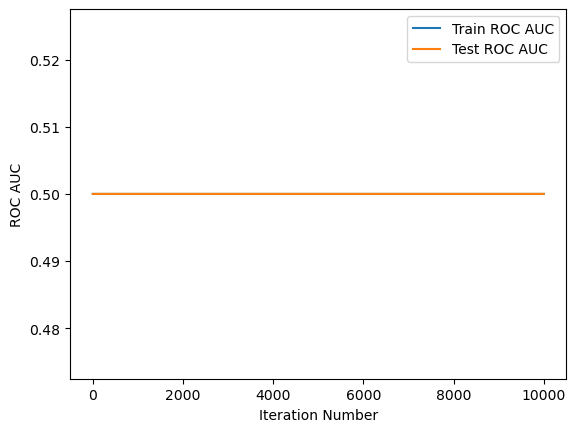

In [111]:
plt.plot(range(1, epochs + 1), train_roc_auc_values, label="Train ROC AUC")
plt.plot(range(1, epochs + 1), test_roc_auc_values, label="Test ROC AUC")
plt.xlabel("Iteration Number")
plt.ylabel("ROC AUC")
plt.legend()
plt.show()

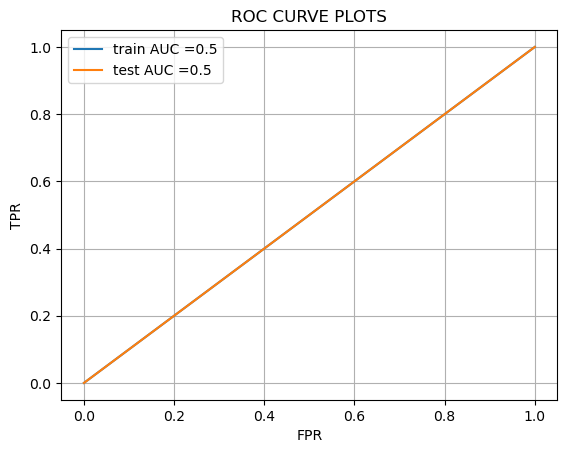

In [112]:
train_pred = nn.predict(X_train.to_numpy())
test_pred = nn.predict(X_test.to_numpy())
train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC CURVE PLOTS")
plt.grid()
plt.show()

the maximum value of tpr*(1-fpr) 0.0 for threshold inf


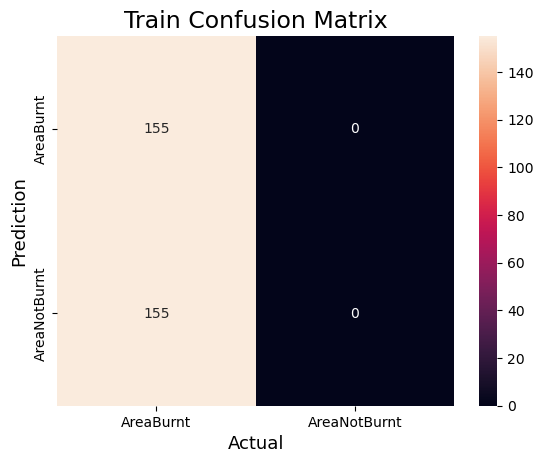

In [113]:
cm = confusion_matrix(y_train, predict(train_pred, tr_thresholds, train_fpr, train_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Train Confusion Matrix',fontsize=17)
plt.show()

the maximum value of tpr*(1-fpr) 0.0 for threshold inf


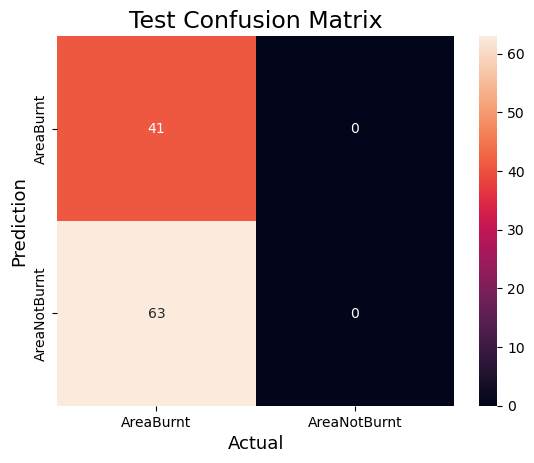

In [114]:
cm = confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Test Confusion Matrix',fontsize=17)
plt.show()

In [115]:
tp = cm[0][0]
fp = cm[0][1]
fn = cm[1][0]
tn = cm[1][1]
precision = tp / (tp + fp)
recall = tp / (tp + fn)
f1score = (2 * precision * recall) / (precision + recall)
print('Precision is :')
print(precision)
print('Recall is :')
print(recall)
print('F1-Score is :')
print(f1score)

Precision is :
1.0
Recall is :
0.3942307692307692
F1-Score is :
0.5655172413793104


# ***5. ML Model 4 (Based on research literature)***

For ML Model 4 we have implemented the ExtraTreesClassifier from scratch

In [116]:
class ExtraTreesClassifier:
    def __init__(self, n_estimators=100, max_depth=None, min_samples_split=2, max_features=None):
        self.n_estimators = n_estimators
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.max_features = max_features
        self.trees = []

    def fit(self, X, y):
        n_samples, n_features = X.shape

        for _ in range(self.n_estimators):
            bootstrap_indices = np.random.choice(n_samples, n_samples, replace=True)
            if self.max_features is None:
                random_feature_indices = np.arange(n_features)
            else:
                random_feature_indices = np.random.choice(n_features, self.max_features, replace=False)

            X_bootstrap = X[bootstrap_indices][:, random_feature_indices]
            y_bootstrap = np.array(y)[bootstrap_indices.astype(int)]  # Convert y to a list

            tree = DecisionTree(max_depth=self.max_depth, min_samples_split=self.min_samples_split)
            tree.fit(X_bootstrap, y_bootstrap, feature_indices=random_feature_indices)
            self.trees.append(tree)

    def predict(self, X):
        predictions = np.array([tree.predict(X) for tree in self.trees])
        ensemble_predictions = np.empty(X.shape[0], dtype=int)

        for i in range(X.shape[0]):
            unique_classes, counts = np.unique(predictions[:, i], return_counts=True)
            ensemble_predictions[i] = unique_classes[np.argmax(counts)]

        return ensemble_predictions

class DecisionTree:
    def __init__(self, max_depth=None, min_samples_split=2):
        self.max_depth = max_depth
        self.min_samples_split = min_samples_split
        self.split_feature = None
        self.split_threshold = None
        self.left = None
        self.right = None
        self.label = None

    def fit(self, X, y, feature_indices):
        if self.max_depth is None or self.max_depth > 0:
            if len(np.unique(y)) == 1 or len(y) < self.min_samples_split:
                self.label = np.argmax(np.bincount(y))
                return

            num_features = len(feature_indices)
            best_gini = float('inf')

            for feature_index in feature_indices:
                thresholds = np.unique(X[:, feature_index])
                for threshold in thresholds:
                    left_indices = np.where(X[:, feature_index] < threshold)
                    right_indices = np.where(X[:, feature_index] >= threshold)
                    if len(left_indices[0]) == 0 or len(right_indices[0]) == 0:
                        continue

                    left_gini = self.calculate_gini(y[left_indices])
                    right_gini = self.calculate_gini(y[right_indices])
                    weighted_gini = (len(left_indices[0]) / len(y)) * left_gini + (len(right_indices[0]) / len(y)) * right_gini

                    if weighted_gini < best_gini:
                        best_gini = weighted_gini
                        self.split_feature = feature_index
                        self.split_threshold = threshold
                        self.left = DecisionTree(max_depth=None, min_samples_split=self.min_samples_split)
                        self.right = DecisionTree(max_depth=None, min_samples_split=self.min_samples_split)

            if self.split_feature is not None:
                left_indices = np.where(X[:, self.split_feature] < self.split_threshold)
                right_indices = np.where(X[:, self.split_feature] >= self.split_threshold)
                self.left.fit(X[left_indices], y[left_indices], feature_indices)
                self.right.fit(X[right_indices], y[right_indices], feature_indices)
            else:
                self.label = np.argmax(np.bincount(y))
        else:
            self.label = np.argmax(np.bincount(y))

    def calculate_gini(self, y):
        m = len(y)
        if m == 0:
            return 0
        p = np.bincount(y) / m
        return 1 - np.sum(p ** 2)

    def predict(self, X):
        if self.label is not None:
            return np.full(X.shape[0], self.label)
        else:
            left_indices = np.where(X[:, self.split_feature] < self.split_threshold)
            right_indices = np.where(X[:, self.split_feature] >= self.split_threshold)
            predictions = np.zeros(X.shape[0], dtype=int)
            if len(left_indices[0]) > 0:
                predictions[left_indices] = self.left.predict(X[left_indices])
            if len(right_indices[0]) > 0:
                predictions[right_indices] = self.right.predict(X[right_indices])
            return predictions


In [117]:
y_train_list = [1 if x == 1.0 else 0 for x in y_train.tolist()]

In [ ]:
base_lerner=list(range(1,200,40))
max_depth=[1, 2, 3, 4, 5]
train_auc = []
cv_auc = []
train_final = []
cv_final = []

for learner in base_lerner :
    for depth in max_depth :
        clf=ExtraTreesClassifier(max_depth = depth,n_estimators = learner)#,min_samples_leaf = samples_leaf)
        clf.fit(X_train.to_numpy(), y_train_list)
        y_train_pred = clf.predict(X_train.to_numpy())
        y_cv_pred = clf.predict(X_validation.to_numpy())
        # roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
        # not the predicted outputs
        train_auc.append(roc_auc_score(y_train_list,y_train_pred))
        cv_auc.append(roc_auc_score(y_validation, y_cv_pred))
    train_final.append(train_auc)
    cv_final.append(cv_auc)
    train_auc = []
    cv_auc = []

In [ ]:
import itertools
cm = np.array(train_final)
plt.figure(figsize=(20,15))
plt.ylabel('Max Depth')
plt.xlabel('n_estimators')
plt.imshow(cm, interpolation='nearest')
plt.title("Train AUC Scores")
plt.colorbar()
tick_marks = np.arange(len(base_lerner))
plt.xticks(tick_marks, base_lerner)
plt.yticks(tick_marks, max_depth)
fmt = '0.002g'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),horizontalalignment="center",color="white")
plt.show()

In [ ]:
import itertools
cm = np.array(cv_final)
plt.figure(figsize=(20,15))
plt.ylabel('Max Depth')
plt.xlabel('n_estimators')
plt.imshow(cm, interpolation='nearest')
plt.title("CV AUC Scores")
plt.colorbar()
tick_marks = np.arange(len(base_lerner))
plt.xticks(tick_marks, base_lerner)
plt.yticks(tick_marks, max_depth)
fmt = '0.002g'
thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),horizontalalignment="center",color="white")
plt.show()

In [ ]:
train3d = [item for sublist in train_final for item in sublist]
cv3d = [item for sublist in cv_final for item in sublist]

In [ ]:
trace1 = go.Scatter3d(x=base_lerner,y=max_depth,z= train3d, name = 'train')
trace2 = go.Scatter3d(x=base_lerner,y=max_depth,z=cv3d, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='n_estimators'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [ ]:
f1_array = np.array(cv_final)
#print(f1_array.shape)
t=np.unravel_index(np.argmax(f1_array), f1_array.shape)
optimal_no_of_baselearn=base_lerner[t[0]]
print("Optimal No of base learners are ")
print(optimal_no_of_baselearn)
optimal_depth = max_depth[t[1]]
print("Optimal Max Depth is ")
print(optimal_depth)

In [ ]:
clf=ExtraTreesClassifier(max_depth = optimal_depth,n_estimators = optimal_no_of_baselearn)#,min_samples_leaf = samples_leaf)
clf.fit(X_train.to_numpy(), y_train_list)
# roc_auc_score(y_true, y_score) the 2nd parameter should be probability estimates of the positive class
# not the predicted outputs

y_train_pred = clf.predict(X_train.to_numpy())    
y_test_pred = clf.predict(X_test.to_numpy()) 

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_pred)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_pred)

plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.title("ROC AUC PLOTS")
plt.grid()
plt.show()

In [ ]:
print("Train confusion matrix")
print(confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_tpr)))
print("Test confusion matrix")
print(confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_tpr)))

In [ ]:
cm = confusion_matrix(y_train, predict(y_train_pred, tr_thresholds, train_fpr, train_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Train Confusion Matrix',fontsize=17)
plt.show()

In [ ]:
cm = confusion_matrix(y_test, predict(y_test_pred, tr_thresholds, test_fpr, test_fpr))
 
#Plot the confusion matrix.
sns.heatmap(cm, 
            annot=True,
            fmt='g', 
            xticklabels=['AreaBurnt','AreaNotBurnt'],
            yticklabels=['AreaBurnt','AreaNotBurnt'])
plt.ylabel('Prediction',fontsize=13)
plt.xlabel('Actual',fontsize=13)
plt.title('Test Confusion Matrix',fontsize=17)
plt.show()

In [ ]:
tp = cm[0][0]
fp = cm[0][1]
fn = cm[1][0]
tn = cm[1][1]
precision = tp / (tp + fp)
recall = tp / (tp + fn)
f1score = (2 * precision * recall) / (precision + recall)
print('Precision is :')
print(precision)
print('Recall is :')
print(recall)
print('F1-Score is :')
print(f1score)

# ***6. Comparison of insights drawn from the models***

Since the dataset is not exactly balanced so we have biased our evaluation metrics more towards precison, recall,F1-Score and AUC-ROC scores instead of accuracy.<br>
The evaluation metric values for different models are as follows:

### KNN
1) Train AUC Score : 0.75 <br>
2) Test  AUC Score : 0.61 <br>
3) F1 Score : 0.54 <br>
4) Precision : 0.56 <br>
5) Recall : 0.541 <br>

The Test Confusion Matrix has higher values along the major diagonal which indicates that it has correctly classified high number of data points. 

### Multinomial Naive Bayes

1) Train AUC Score : 0.90 <br>
2) Test  AUC Score : 0.46 <br>
3) F1 Score : 0.43 <br>
4) Precision : 0.53 <br>
5) Recall : 0.36 <br>

In the Test Confusion Matrix, the minor diagonal has slightly higher values than major diagonal. This indicates that the model's incorrect classifications are slightly higher than the model's correct classifications.

### MultiLayer Perceptron

1) Train AUC Score : 0.5 <br>
2) Test  AUC Score : 0.5 <br>
3) F1 Score : 0.56 <br>
4) Precision : 0.1 <br>
5) Recall : 0.39 <br>

In the Test Confusion Matrix, the minor diagonal has slightly higher values than major diagonal. This indicates that the model's incorrect classifications are slightly higher than the model's correct classifications.

### ExtraTrees Classifier

1) Train AUC Score : 0.99 <br>
2) Test  AUC Score : 0.47 <br>
3) F1 Score : 0.44 <br>
4) Precision : 0.53 <br>
5) Recall : 0.37 <br>

In the Test Confusion Matrix, the minor diagonal has slightly higher values than major diagonal. This indicates that the model's incorrect classifications are slightly higher than the model's correct classifications.

### Inference

The KNN model exhibits the highest performance, followed by the MultiLayer Perceptron, which also delivers a strong performance. The MultiNomial Naive Bayes and ExtraTrees Classifier demonstrate comparable performance, although it falls short of both the MultiLayer Perceptron and KNN in terms of overall performance.


# **_7. References_**

1.  Geurts, P., Ernst, D. & Wehenkel, L. Extremely randomized trees. Mach Learn 63, 3–42 (2006). https://doi.org/10.1007/s10994-006-6226-1. <br>

2.   https://link.springer.com/content/pdf/10.1007/s10994-006-6226-1.pdf <br>

3.  https://towardsdatascience.com/what-when-how-extratrees-classifier-c939f905851c <br>

4.  https://scikit-learn.org/stable/modules/generated/sklearn.naive_bayes.MultinomialNB.html <br>

5.   https://www.researchgate.net/profile/Anees-Ahmed5/publication/334451164_Multinomial_Naive_Bayes_Classification_Model_for_Sentiment_Analysis/links/5e227e8d92851cafc38c813c/Multinomial-Naive-Bayes-Classification-Model-for-Sentiment-Analysis.pdf <br>


